## Сегментация изображений клеток

Вам предстоит обучить модель сегментировать изображения с дрожжевыми клетками и микроструктурами (см. [06_segmentation.ipynb](../workshops/06_segmentation.ipynb)), по пути поэкспериментировав с разными архитектурами и функцими ошибки.

### Задание 1 (2 балл). Метрики сегментации
Перед экспериментами нужно определиться с метриками. Выберите 3-5 метрик, по которым вы будете оценивать качество модели. В этом задании объясните свой выбор и найдите нужные метрики в `torchvision` (а если их нет - реализуйте самостоятельно, здесь вам может помочь [05_lightning_etc.ipynb](../workshops/05_lightning_etc.ipynb))

Возьмем

torchmetrics.F1Score(task="multiclass", num_classes=num_classes, average="macro")

torchmetrics.Recall(task="multiclass", num_classes=num_classes, average="macro")

torchmetrics.Precision(task="multiclass", num_classes=num_classes, average="macro")

Это какие-то стандартные метрики, лучше использовать F1, потому что за ней легче следить(она более информативна), эти метрики хорошо отображают попадания для каждого из классов

torchmetrics.Dice(num_classes=num_classes, average="macro")

torchmetrics.JaccardIndex(task="multiclass", num_classes=num_classes, average="macro")

Нашел еще две такие часто используемые метрики для сегментации. Они чувствительны к различиям между пикселями фона и объектов.




### Задание 2 (4 балла). Обучение модели
Возьмите модель и датасеты из практики по сегментации и запустите обучение.

Указания:
- Каждую эпоху сохраняйте значения ошибки и выбранные в задании 1 метрики как для обучающего датасета (`train`), так и для валидационного (`val`).
- Каждую эпоху сохраняйте примеры работы модели на 8 случайных изображениях из валидационного датасета (одной картинкой, как в практике).
- После окончания обучения выведите графики значений ваших метрик и примеры предсказаний (достаточно 4-5 изображений: для первой эпохи, 2-3 в середине обучения и ндля последней эпохи).
- Можете использовать `lightning` (вместо `lightning.pytorch.loggers.TensorBoardLogger` можно использовать `lightning.pytorch.loggers.CSVLogger`, а сохранение изображений можете реализовать как `lightning.pytorch.Callback`), а можете всё написать вручную.

In [2]:
from pathlib import Path

import lightning as L
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
from torch import Tensor
from torch.utils.data import Dataset
from torchvision import transforms

In [3]:
# ! wget https://tudatalib.ulb.tu-darmstadt.de/bitstream/handle/tudatalib/3799/yeast_cell_in_microstructures_dataset.zip
# ! unzip yeast_cell_in_microstructures_dataset.zip -d yeast_cell_in_microstructures_dataset

In [4]:
dataset_dir = Path("yeast_cell_in_microstructures_dataset")

class YeastDataset(Dataset):
    def __init__(self, subset_dir: Path) -> None:
        super().__init__()
        self.subset_dir = subset_dir
        self.items = list((self.subset_dir / "inputs").glob("*.pt"))
        self.items = self.items[0:int(len(self.items)/8)*8]

    def __getitem__(self, index: int) -> tuple[Tensor, dict[str, Tensor]]:
        # нужно вернуть пару
        # тензор изображения C x W x H
        # словарь с ключами boxes, masks, labels
        image_path = self.items[index]
        image = torch.load(image_path, weights_only=True).unsqueeze(
            0
        )  # (W, H) -> (1, W, H)
        classes = (
            torch.load(
                self.subset_dir / "classes" / image_path.parts[-1], weights_only=True
            )
            + 1
        )  # 0 класс - фон
        masks = torch.load(
            self.subset_dir / "instances" / image_path.parts[-1], weights_only=True
        )
        boxes = torch.load(
            self.subset_dir / "bounding_boxes" / image_path.parts[-1], weights_only=True
        )
        return image, dict(
            boxes=boxes,
            labels=classes,
            masks=masks,
        )

    def __len__(self) -> int:
        return len(self.items)


In [5]:
class YeastSemanticSegmDataset(YeastDataset):
    def __getitem__(self, index: int) -> tuple[Tensor, Tensor]:
        image, annotation = super().__getitem__(index)
        # нужно сформировать маску: тензор размера W x H, где для каждого пиксела указан класс
        mask = (
            (annotation["masks"] * annotation["labels"].view(-1, 1, 1)).sum(dim=0)
        ).long()

        return image, mask

In [6]:
from typing import Any, Callable, Type

from lightning.pytorch.utilities.types import EVAL_DATALOADERS, TRAIN_DATALOADERS
from torch.utils.data import DataLoader

_collate_fn_t = Callable[[list[tuple[Tensor, Any]]], Any]


class Datamodule(L.LightningDataModule):
    def __init__(
        self,
        datadir: Path,
        dataset_class: Type[Dataset],
        batch_size: int,
        train_subdir: str = "train",
        val_subdir: str = "val",
        test_subdir: str = "test",
    ) -> None:
        super().__init__()
        self.batch_size = batch_size
        self.dataset_class = dataset_class
        self.train_dir = datadir / train_subdir
        self.val_dir = datadir / val_subdir
        self.test_dir = datadir / test_subdir

    @property
    def collate_fn(self) -> _collate_fn_t | None:
        if self.dataset_class == YeastSemanticSegmDataset:
            return None
        else:
            return lambda batch: tuple(zip(*batch))

    def setup(self, stage: str) -> None:
        if stage in ("fit", "validate"):
            self.val_dataset = self.dataset_class(self.val_dir)
        if stage == "fit":
            self.train_dataset = self.dataset_class(self.train_dir)
        elif stage == "test":
            self.test_dataset = self.dataset_class(self.test_dir)

    def train_dataloader(self) -> TRAIN_DATALOADERS:
        return DataLoader(
            self.train_dataset,
            batch_size=self.batch_size,
            shuffle=True,
            collate_fn=self.collate_fn,
        )

    def val_dataloader(self) -> EVAL_DATALOADERS:
        return DataLoader(
            self.val_dataset,
            batch_size=self.batch_size,
            shuffle=False,
            collate_fn=self.collate_fn,
        )

    def test_dataloader(self) -> EVAL_DATALOADERS:
        return DataLoader(
            self.test_dataset,
            batch_size=self.batch_size,
            shuffle=False,
            collate_fn=self.collate_fn,
        )

In [7]:
class DoubleConv(nn.Module):
    """(convolution => [BN] => ReLU) * 2"""

    def __init__(
        self, in_channels: int, out_channels: int, mid_channels: int | None = None
    ) -> None:
        super().__init__()
        if not mid_channels:
            mid_channels = out_channels
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, mid_channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(mid_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(mid_channels, out_channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
        )

    def forward(self, x: Tensor) -> Tensor:
        return self.double_conv(x)

In [8]:
class Down(nn.Module):
    """Downscaling with maxpool then double conv"""

    def __init__(self, in_channels: int, out_channels: int) -> None:
        super().__init__()
        self.maxpool_conv = nn.Sequential(
            nn.MaxPool2d(2), DoubleConv(in_channels, out_channels)
        )

    def forward(self, x: Tensor) -> Tensor:
        return self.maxpool_conv(x)

In [9]:
class Up(nn.Module):
    """Upscaling then double conv"""

    def __init__(
        self, in_channels: int, out_channels: int, bilinear: bool = True
    ) -> None:
        super().__init__()

        # if bilinear, use the normal convolutions to reduce the number of channels
        if bilinear:
            self.up = nn.Upsample(scale_factor=2, mode="bilinear", align_corners=True)
            self.conv = DoubleConv(in_channels, out_channels, in_channels // 2)
        else:
            self.up = nn.ConvTranspose2d(
                in_channels, in_channels // 2, kernel_size=2, stride=2
            )
            self.conv = DoubleConv(in_channels, out_channels)

    def forward(self, x_prev: Tensor, x_skip: Tensor) -> Tensor:
        x_prev = self.up(x_prev)
        # input is BCHW
        d_height = x_skip.size()[2] - x_prev.size()[2]
        d_width = x_skip.size()[3] - x_prev.size()[3]

        x_prev = F.pad(
            x_prev,
            [
                d_width // 2,
                d_width - d_width // 2,
                d_height // 2,
                d_height - d_height // 2,
            ],
        )
        x = torch.cat([x_skip, x_prev], dim=1)
        return self.conv(x)

In [10]:
class UNet(nn.Module):
    def __init__(
        self,
        n_channels: int,
        n_classes: int,
        channel_sizes: list[int],
        bilinear: bool = False,
    ):
        super().__init__()
        self.in_conv = DoubleConv(in_channels=n_channels, out_channels=channel_sizes[0])
        self.downscaler = self.create_downscaler(channel_sizes, bilinear)
        self.upscaler = self.create_upscaler(channel_sizes[::-1], bilinear)
        self.head = nn.Conv2d(channel_sizes[0], n_classes, kernel_size=1)

    @classmethod
    def create_downscaler(
        cls, channel_sizes: list[int], bilinear: bool = False
    ) -> nn.ModuleList:
        """
        Создаём список модулей на основе размеров каналов.
        если используется билинейная интерполяция вместо обратной свёртки,
        то размер последнего (самого большого) канала делаем вдвое меньше

        Args:
            channel_sizes (list[int]): список размеров каналов, напр. [16, 32, 64]
            bilinear (bool, optional): если True, в модели используется билинейная интерполяция
                для выравнивания размеров активаций.
        """
        factor = 2 if bilinear else 1
        down_factors = [1] * (len(channel_sizes) - 2) + [factor]
        return nn.ModuleList(
            [
                Down(fin, fout // dfactor)
                for fin, fout, dfactor in zip(
                    channel_sizes[:-1], channel_sizes[1:], down_factors
                )
            ]
        )

    @classmethod
    def create_upscaler(
        cls, channel_sizes: list[int], bilinear: bool = False
    ) -> nn.ModuleList:
        """
        Создаём список модулей на основе размеров каналов.
        Если используется билинейная интерполяция вместо обратной свёртки,
        то размер первого (самого большого) канала делаем вдвое меньше

        Args:
            channel_sizes (list[int]): список размеров каналов, напр. [16, 32, 64]
            bilinear (bool, optional): если True, в модели используется билинейная интерполяция
                для выравнивания размеров активаций.
        """
        factor = 2 if bilinear else 1
        up_factors = [factor] * (len(channel_sizes) - 2) + [1]
        return nn.ModuleList(
            [
                Up(fin, fout // ufactor, bilinear=bilinear)
                for fin, fout, ufactor in list(
                    zip(channel_sizes[:-1], channel_sizes[1:], up_factors)
                )
            ]
        )

    def forward(self, x: Tensor) -> Tensor:
        # создаём список для хранения промежуточных активаций
        xs = []
        # делаем входную свёртку
        x = self.in_conv(x)

        # downscaling
        for conv in self.downscaler:
            xs.append(x)
            x = conv(x)

        # разворачиваем промежуточные активации и делаем upscaling
        xs.reverse()
        for conv, act in zip(self.upscaler, xs):
            x = conv(x, act)

        # финальная свёртка для получения логитов пикселей
        logits = self.head(x)
        return logits

In [11]:
torch.manual_seed(42)
model = UNet(n_channels=1, n_classes=3, channel_sizes=[16, 32, 64, 128], bilinear=True)
sum([p.numel() for p in model.parameters()])

268515

In [12]:
optimizer = torch.optim.Adam(model.parameters(), lr=0.01)

In [13]:
import torchmetrics.classification
from typing import Any

from lightning.pytorch.utilities.types import STEP_OUTPUT
from lightning.pytorch.loggers import TensorBoardLogger
from lightning.pytorch.callbacks import EarlyStopping, ModelCheckpoint

def print_result(predictions, images):
    original_images_grid = torchvision.utils.make_grid(images, nrow=4, normalize=True)
    masks_grid = torchvision.utils.make_grid(
        torch.nn.functional.one_hot(predictions.argmax(dim=1), 3).permute(0, 3, 1, 2)[:, 1:]
        > 0,
        nrow=4,
    )

    predictions_grid = torchvision.utils.draw_segmentation_masks(
        original_images_grid,
        masks=masks_grid,
        alpha=0.4,
        colors=["red", "green"],
    )

    plt.figure(figsize=(12, 5))
    plt.axis("off")
    plt.imshow(transforms.ToPILImage()(predictions_grid))

metrics_for_plot = {
            "val_loss": [],
            "val_MulticlassRecall": [],
            "val_MulticlassPrecision": [],
            "val_MulticlassF1Score": [],
            "val_Dice": [],
            "val_MulticlassJaccardIndex": []
}

def update(res):
  for h in metrics_for_plot:
    metrics_for_plot[h].append(float(res[h]))

def create_classification_metrics(
    num_classes: int, prefix: str
) -> torchmetrics.MetricCollection:
    return torchmetrics.MetricCollection(
        [
            torchmetrics.Recall(task="multiclass", num_classes=num_classes, average="macro"),
            torchmetrics.Precision(task="multiclass", num_classes=num_classes, average="macro"),
            torchmetrics.F1Score(task="multiclass", num_classes=num_classes, average="macro"),
            torchmetrics.Dice(num_classes=num_classes, average="macro"),
            torchmetrics.JaccardIndex(task="multiclass", num_classes=num_classes, average="macro")
        ],
        prefix=prefix,
    )


class Lit(L.LightningModule):
    def __init__(self, model: nn.Module, learning_rate: float) -> None:
        super().__init__()
        self.save_hyperparameters()
        self.model = model
        self.learning_rate = learning_rate
        self.train_metrics = create_classification_metrics(num_classes=3, prefix="train_")
        self.val_metrics = create_classification_metrics(num_classes=3, prefix="val_")
        self.predictions = None
        self.images = None

    def training_step(
        self, batch: tuple[Tensor, Tensor], batch_idx: int
    ) -> STEP_OUTPUT:
        x, y = batch
        y_hat = self.model.forward(x)

        self.predictions = y_hat
        self.images = x
        
        loss = F.cross_entropy(y_hat, y)
        self.log("train_loss", loss, on_epoch=True, on_step=False)
        self.train_metrics.update(y_hat, y)
        self.log_dict(self.train_metrics, on_step=False, on_epoch=True)

        return loss

    def validation_step(
        self, batch: tuple[Tensor, Tensor], batch_idx: int
    ) -> STEP_OUTPUT | None:
        x, y = batch
        y_hat = self.model.forward(x)

        self.predictions = y_hat
        self.images = x

        loss = F.cross_entropy(y_hat, y)
        self.log("val_loss", loss, on_epoch=True, on_step=False)
        self.val_metrics.update(y_hat, y)
        self.log_dict(self.val_metrics, on_step=False, on_epoch=True)

        return {
            "loss": loss,
            "preds": y_hat,
        }

    def on_validation_epoch_end(self) -> None:
        val_loss = self.trainer.callback_metrics["val_loss"]
        val_f1 = self.trainer.callback_metrics["val_MulticlassF1Score"]
        val_recall = self.trainer.callback_metrics["val_MulticlassRecall"]
        val_precision = self.trainer.callback_metrics["val_MulticlassPrecision"]
        val_jaccard = self.trainer.callback_metrics["val_MulticlassJaccardIndex"]
        val_dice = self.trainer.callback_metrics["val_Dice"]
        update(self.trainer.callback_metrics)
        print(f" Val. Loss: {val_loss:.4f},\n Val. F1Score: {val_f1:.4f},\n Val. Recall: {val_recall:.4f},\n Val. Precision: {val_precision:.4f},\n Val. MulticlassJaccardIndex: {val_jaccard:.4f},\n Val. MulticlassDice: {val_dice:.4f}\n")
        print_result(self.predictions, self.images)
        self.val_metrics.reset()
        pass

    def configure_optimizers(self) -> dict[str, Any]:
        optimizer = torch.optim.Adam(self.model.parameters(), lr=self.learning_rate, weight_decay=1e-4)
        # давайте кроме оптимизатора создадим ещё расписание для шага оптимизации
        return {
            "optimizer": optimizer,
            "lr_scheduler": torch.optim.lr_scheduler.MultiStepLR(
                optimizer, milestones=[5, 10, 15]
            ),
        }

GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Users/matvey/miniconda3/envs/dl-mcs/lib/python3.12/site-packages/lightning/pytorch/utilities/parsing.py:208: Attribute 'model' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['model'])`.

  | Name          | Type             | Params | Mode 
-----------------------------------------------------------
0 | model         | UNet             | 268 K  | train
1 | train_metrics | MetricCollection | 0      | train
2 | val_metrics   | MetricCollection | 0      | train
-----------------------------------------------------------
268 K     Trainable params
0         Non-trainable params
268 K     Total params
1.074     Total estimated model params size (MB)
87        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/Users/matvey/miniconda3/envs/dl-mcs/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:424: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.


 Val. Loss: 1.1831,
 Val. F1Score: 0.0635,
 Val. Recall: 0.3333,
 Val. Precision: 501372182664839168.0000,
 Val. MulticlassJaccardIndex: 0.0351,
 Val. MulticlassDice: 0.0635



/Users/matvey/miniconda3/envs/dl-mcs/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:424: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Users/matvey/miniconda3/envs/dl-mcs/lib/python3.12/site-packages/lightning/pytorch/loops/fit_loop.py:298: The number of training batches (37) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.5731,
 Val. F1Score: 0.8518,
 Val. Recall: 0.8856,
 Val. Precision: 0.8270,
 Val. MulticlassJaccardIndex: 0.7481,
 Val. MulticlassDice: 0.8518



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.3586,
 Val. F1Score: 0.8987,
 Val. Recall: 0.9391,
 Val. Precision: 0.8665,
 Val. MulticlassJaccardIndex: 0.8194,
 Val. MulticlassDice: 0.8987



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.2850,
 Val. F1Score: 0.8851,
 Val. Recall: 0.9165,
 Val. Precision: 0.8644,
 Val. MulticlassJaccardIndex: 0.7980,
 Val. MulticlassDice: 0.8851



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.2086,
 Val. F1Score: 0.9117,
 Val. Recall: 0.9331,
 Val. Precision: 0.8966,
 Val. MulticlassJaccardIndex: 0.8402,
 Val. MulticlassDice: 0.9117



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.1557,
 Val. F1Score: 0.9338,
 Val. Recall: 0.9389,
 Val. Precision: 0.9305,
 Val. MulticlassJaccardIndex: 0.8777,
 Val. MulticlassDice: 0.9338



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.1370,
 Val. F1Score: 0.9496,
 Val. Recall: 0.9509,
 Val. Precision: 0.9485,
 Val. MulticlassJaccardIndex: 0.9055,
 Val. MulticlassDice: 0.9496



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.1305,
 Val. F1Score: 0.9515,
 Val. Recall: 0.9512,
 Val. Precision: 0.9517,
 Val. MulticlassJaccardIndex: 0.9087,
 Val. MulticlassDice: 0.9515



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.1312,
 Val. F1Score: 0.9505,
 Val. Recall: 0.9490,
 Val. Precision: 0.9521,
 Val. MulticlassJaccardIndex: 0.9070,
 Val. MulticlassDice: 0.9505



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.1260,
 Val. F1Score: 0.9513,
 Val. Recall: 0.9481,
 Val. Precision: 0.9548,
 Val. MulticlassJaccardIndex: 0.9084,
 Val. MulticlassDice: 0.9513



Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=10` reached.


 Val. Loss: 0.1236,
 Val. F1Score: 0.9521,
 Val. Recall: 0.9571,
 Val. Precision: 0.9472,
 Val. MulticlassJaccardIndex: 0.9097,
 Val. MulticlassDice: 0.9521



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.1236,
 Val. F1Score: 0.9521,
 Val. Recall: 0.9571,
 Val. Precision: 0.9472,
 Val. MulticlassJaccardIndex: 0.9097,
 Val. MulticlassDice: 0.9521

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
     Validate metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
         val_Dice             0.9520606994628906
  val_MulticlassF1Score       0.9520606994628906
val_MulticlassJaccardIndex    0.9096579551696777
 val_MulticlassPrecision      0.9471981525421143
   val_MulticlassRecall       0.9570584297180176
         val_loss            0.12357605248689651
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


[{'val_loss': 0.12357605248689651,
  'val_MulticlassRecall': 0.9570584297180176,
  'val_MulticlassPrecision': 0.9471981525421143,
  'val_MulticlassF1Score': 0.9520606994628906,
  'val_Dice': 0.9520606994628906,
  'val_MulticlassJaccardIndex': 0.9096579551696777}]

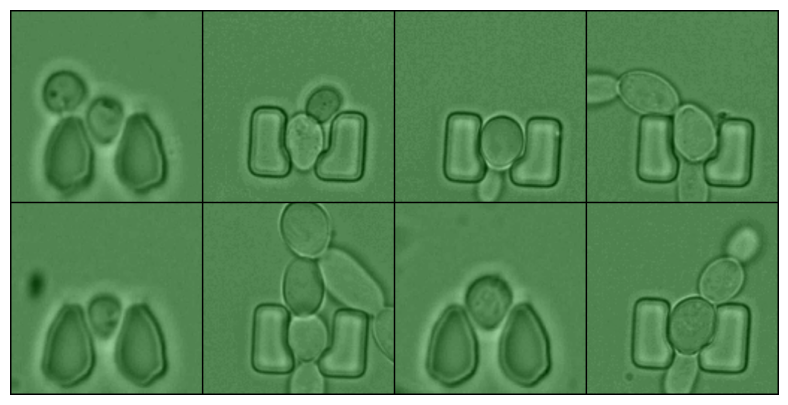

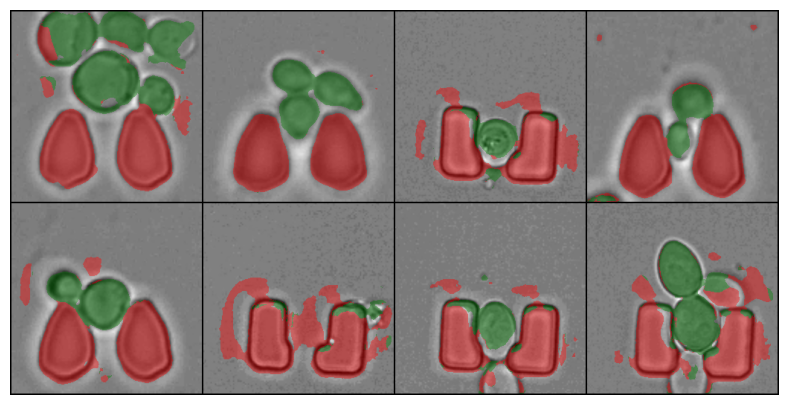

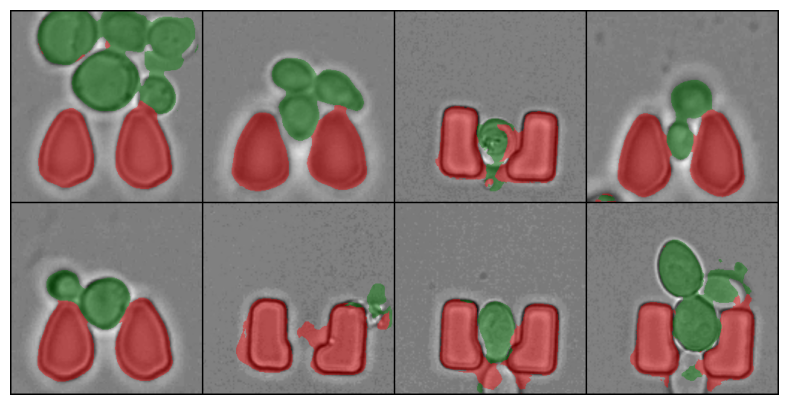

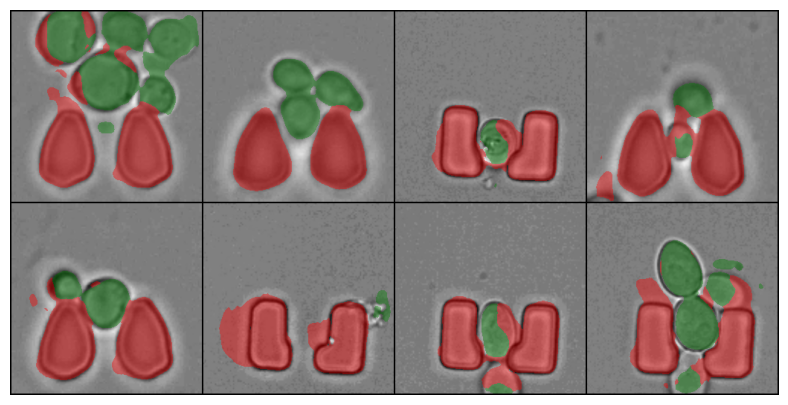

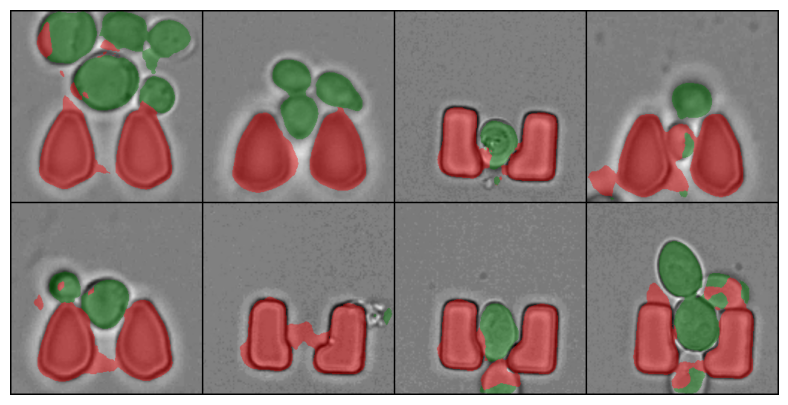

...

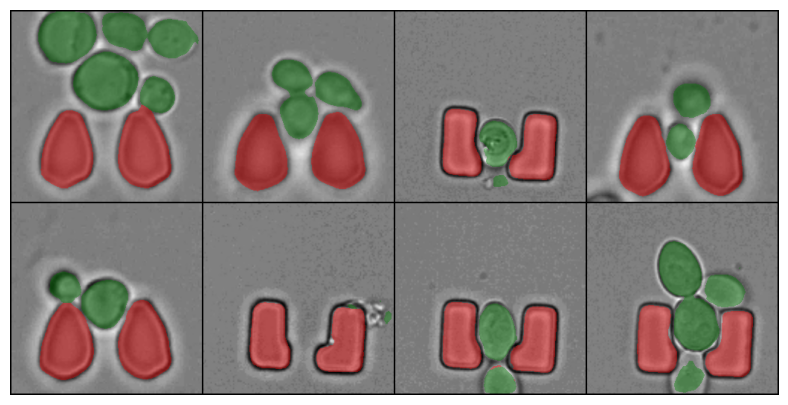

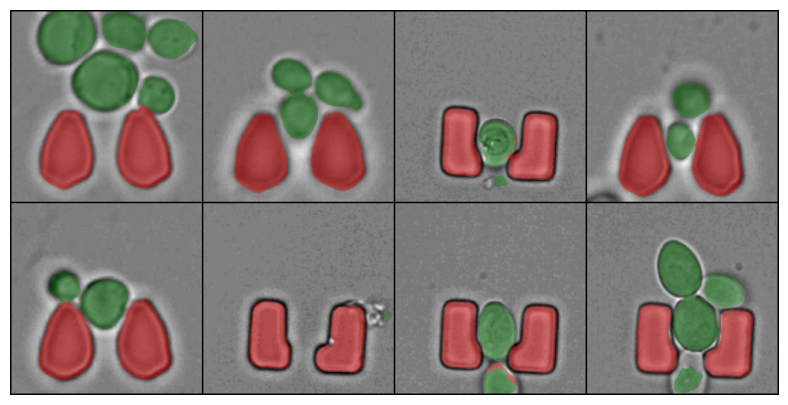

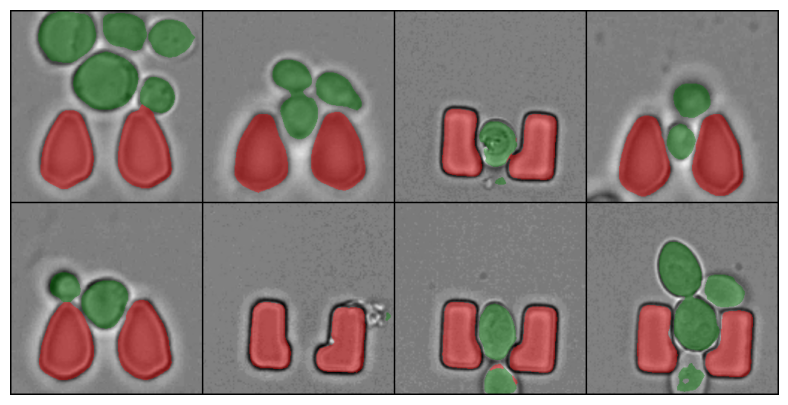

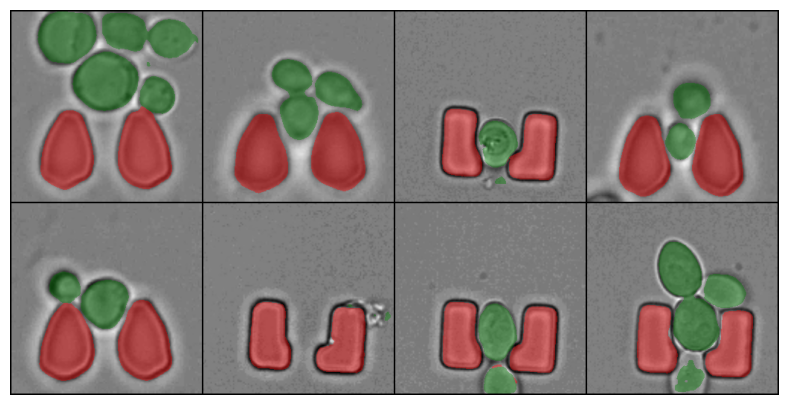

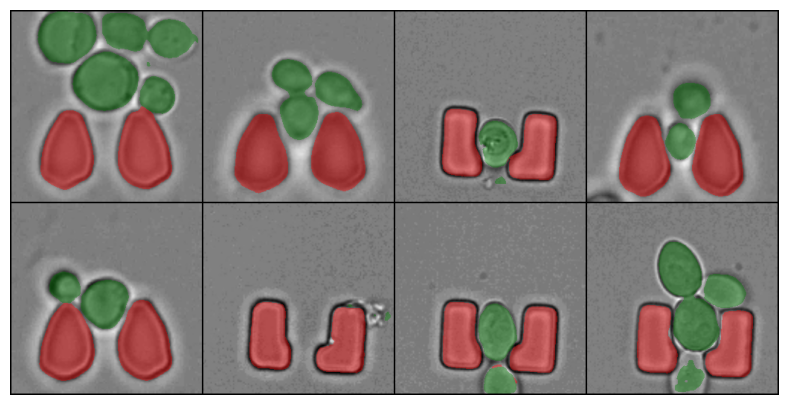

In [14]:
torch.manual_seed(42)
datamodule = Datamodule(
    datadir=Path("yeast_cell_in_microstructures_dataset"),
    dataset_class=YeastSemanticSegmDataset,
    batch_size=8,
)
datamodule.setup("fit")
images, masks = next(iter(datamodule.train_dataloader()))
trainer = L.Trainer(
    accelerator="auto",
    max_epochs=10,
    limit_train_batches=None,
    limit_val_batches=None,
)
model = Lit(
    model = UNet(n_channels=1, n_classes=3, channel_sizes=[16, 32, 64, 128], bilinear=True),
    learning_rate=1e-3,
)

trainer.fit(
    model=model,
    datamodule=datamodule,
)

trainer.validate(model=model, dataloaders=datamodule.val_dataloader())


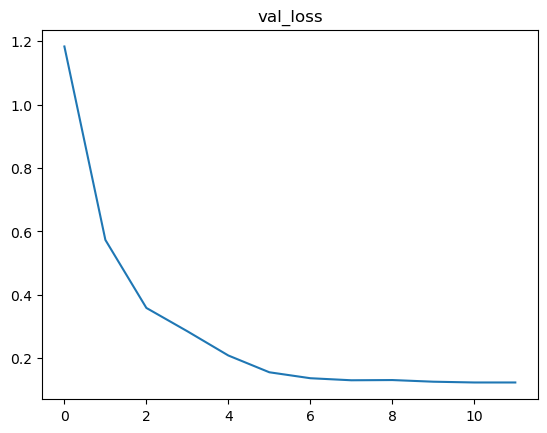

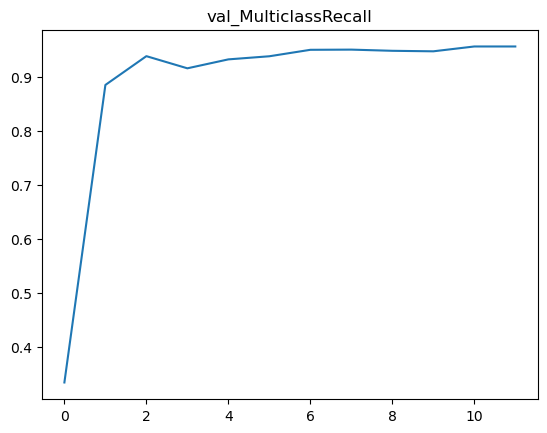

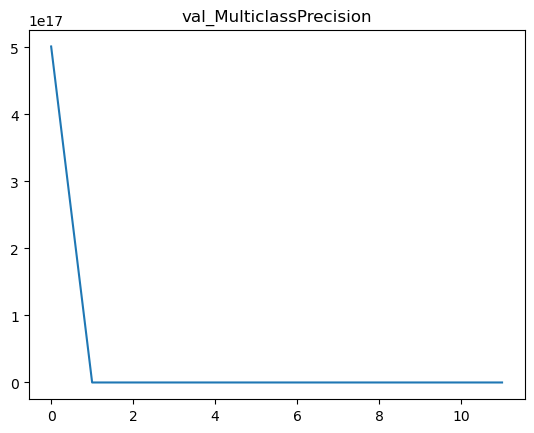

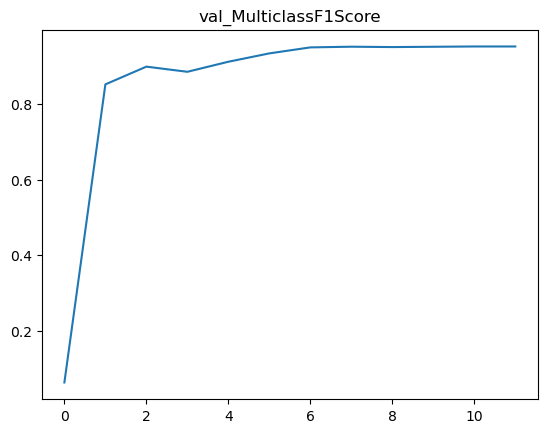

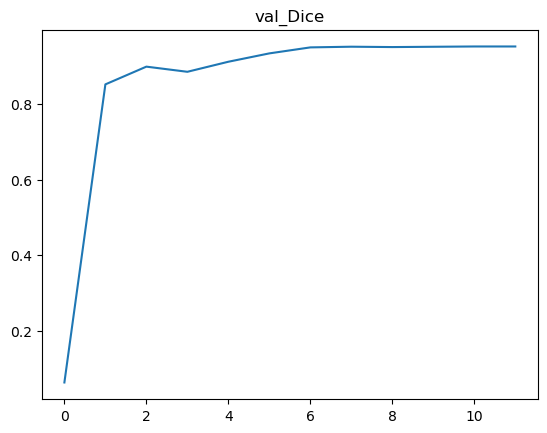

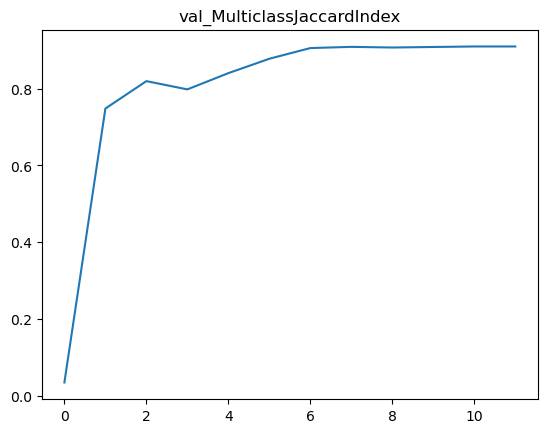

In [15]:
import matplotlib.pyplot as plt

for metric in metrics_for_plot:
  plt.title(metric)
  plt.plot(range(len(metrics_for_plot[metric])), metrics_for_plot[metric])
  plt.show()

### Задание 3 (3 балла). Выбор другой функции ошибки

Полезная ссылка:
https://www.jeremyjordan.me/semantic-segmentation/#loss

Повторите эксперимент из задания 2, но попробуйте модифицировать функцию ошибки:
- (2 балла) учитывайте пиксели на границе объектов с большим весом, как предлагается в статье [U-Net](https://arxiv.org/abs/1505.04597)
- (1 балл) используйте soft Dice loss

Опишите свои наблюдения, что изменилось? Обратите внимание на скорость обучения, визуальные артефакты предсказаний, динамику метрик.


In [16]:
def soft_dice_loss(y_true_, y_pred, epsilon=1e-6):
    '''
    Soft dice loss calculation for arbitrary batch size, number of classes, and number of spatial dimensions.
    Assumes the `channels_last` format.

    # Arguments
        y_true: b x X x Y( x Z...) x c One hot encoding of ground truth
        y_pred: b x X x Y( x Z...) x c Network output, must sum to 1 over c channel (such as after softmax)
        epsilon: Used for numerical stability to avoid divide by zero errors

    # References
        V-Net: Fully Convolutional Neural Networks for Volumetric Medical Image Segmentation
        https://arxiv.org/abs/1606.04797
        More details on Dice loss formulation
        https://mediatum.ub.tum.de/doc/1395260/1395260.pdf (page 72)

        Adapted from https://github.com/Lasagne/Recipes/issues/99#issuecomment-347775022
    '''
    y_true = torch.nn.functional.one_hot(y_true_.long(), num_classes=3).permute(0, 3, 1, 2)
    # skip the batch and class axis for calculating Dice score
    axes = tuple(range(1, len(y_pred.shape)-1))
    numerator = 2. * torch.sum(y_pred * y_true, axes)
    denominator = torch.sum(torch.square(y_pred) + torch.square(y_true), axes)

    return 1 - torch.mean((numerator + epsilon) / (denominator + epsilon)) # average over classes and batch
    # thanks @mfernezir for catching a bug in an earlier version of this implementation!

In [17]:
metrics_for_plot = {
            "val_loss": [],
            "val_MulticlassRecall": [],
            "val_MulticlassPrecision": [],
            "val_MulticlassF1Score": [],
            "val_Dice": [],
            "val_MulticlassJaccardIndex": []
}

class Lit(L.LightningModule):
    def __init__(self, model: nn.Module, learning_rate: float) -> None:
        super().__init__()
        self.save_hyperparameters()
        self.model = model
        self.learning_rate = learning_rate
        self.train_metrics = create_classification_metrics(num_classes=3, prefix="train_")
        self.val_metrics = create_classification_metrics(num_classes=3, prefix="val_")
        self.predictions = None
        self.images = None

    def training_step(
        self, batch: tuple[Tensor, Tensor], batch_idx: int
    ) -> STEP_OUTPUT:
        x, y = batch
        y_hat = self.model.forward(x)

        self.predictions = y_hat
        self.images = x
        
        loss = soft_dice_loss(y, y_hat)
        self.log("train_loss", loss, on_epoch=True, on_step=False)
        self.train_metrics.update(y_hat, y)
        self.log_dict(self.train_metrics, on_step=False, on_epoch=True)

        return loss

    def validation_step(
        self, batch: tuple[Tensor, Tensor], batch_idx: int
    ) -> STEP_OUTPUT | None:
        x, y = batch
        y_hat = self.model.forward(x)

        self.predictions = y_hat
        self.images = x

        loss = soft_dice_loss(y, y_hat)
        self.log("val_loss", loss, on_epoch=True, on_step=False)
        self.val_metrics.update(y_hat, y)
        self.log_dict(self.val_metrics, on_step=False, on_epoch=True)

        return {
            "loss": loss,
            "preds": y_hat,
        }

    def on_validation_epoch_end(self) -> None:
        val_loss = self.trainer.callback_metrics["val_loss"]
        val_f1 = self.trainer.callback_metrics["val_MulticlassF1Score"]
        val_recall = self.trainer.callback_metrics["val_MulticlassRecall"]
        val_precision = self.trainer.callback_metrics["val_MulticlassPrecision"]
        val_jaccard = self.trainer.callback_metrics["val_MulticlassJaccardIndex"]
        val_dice = self.trainer.callback_metrics["val_Dice"]
        update(self.trainer.callback_metrics)
        print(f" Val. Loss: {val_loss:.4f},\n Val. F1Score: {val_f1:.4f},\n Val. Recall: {val_recall:.4f},\n Val. Precision: {val_precision:.4f},\n Val. MulticlassJaccardIndex: {val_jaccard:.4f},\n Val. MulticlassDice: {val_dice:.4f}\n")
        print_result(self.predictions, self.images)
        self.val_metrics.reset()
        pass

    def configure_optimizers(self) -> dict[str, Any]:
        optimizer = torch.optim.Adam(self.model.parameters(), lr=self.learning_rate, weight_decay=1e-4)
        # давайте кроме оптимизатора создадим ещё расписание для шага оптимизации
        return {
            "optimizer": optimizer,
            "lr_scheduler": torch.optim.lr_scheduler.MultiStepLR(
                optimizer, milestones=[5, 10, 15]
            ),
        }

GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs

  | Name          | Type             | Params | Mode 
-----------------------------------------------------------
0 | model         | UNet             | 268 K  | train
1 | train_metrics | MetricCollection | 0      | train
2 | val_metrics   | MetricCollection | 0      | train
-----------------------------------------------------------
268 K     Trainable params
0         Non-trainable params
268 K     Total params
1.074     Total estimated model params size (MB)
87        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.9041,
 Val. F1Score: 0.0635,
 Val. Recall: 0.3333,
 Val. Precision: 0.0351,
 Val. MulticlassJaccardIndex: 0.0351,
 Val. MulticlassDice: 0.0635



Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.1731,
 Val. F1Score: 0.6931,
 Val. Recall: 0.7066,
 Val. Precision: 0.7382,
 Val. MulticlassJaccardIndex: 0.5707,
 Val. MulticlassDice: 0.6931



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.1392,
 Val. F1Score: 0.8289,
 Val. Recall: 0.8508,
 Val. Precision: 0.8182,
 Val. MulticlassJaccardIndex: 0.7216,
 Val. MulticlassDice: 0.8289



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.0599,
 Val. F1Score: 0.8741,
 Val. Recall: 0.8570,
 Val. Precision: 0.9023,
 Val. MulticlassJaccardIndex: 0.7865,
 Val. MulticlassDice: 0.8741



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.0367,
 Val. F1Score: 0.9159,
 Val. Recall: 0.8872,
 Val. Precision: 0.9505,
 Val. MulticlassJaccardIndex: 0.8497,
 Val. MulticlassDice: 0.9159



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.0350,
 Val. F1Score: 0.9233,
 Val. Recall: 0.9287,
 Val. Precision: 0.9203,
 Val. MulticlassJaccardIndex: 0.8604,
 Val. MulticlassDice: 0.9233



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.0261,
 Val. F1Score: 0.9436,
 Val. Recall: 0.9393,
 Val. Precision: 0.9483,
 Val. MulticlassJaccardIndex: 0.8952,
 Val. MulticlassDice: 0.9436



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.0250,
 Val. F1Score: 0.9461,
 Val. Recall: 0.9437,
 Val. Precision: 0.9485,
 Val. MulticlassJaccardIndex: 0.8994,
 Val. MulticlassDice: 0.9461



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.0252,
 Val. F1Score: 0.9458,
 Val. Recall: 0.9435,
 Val. Precision: 0.9481,
 Val. MulticlassJaccardIndex: 0.8988,
 Val. MulticlassDice: 0.9458



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.0250,
 Val. F1Score: 0.9458,
 Val. Recall: 0.9406,
 Val. Precision: 0.9514,
 Val. MulticlassJaccardIndex: 0.8990,
 Val. MulticlassDice: 0.9458



Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=10` reached.


 Val. Loss: 0.0244,
 Val. F1Score: 0.9477,
 Val. Recall: 0.9496,
 Val. Precision: 0.9458,
 Val. MulticlassJaccardIndex: 0.9021,
 Val. MulticlassDice: 0.9477



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.0244,
 Val. F1Score: 0.9477,
 Val. Recall: 0.9496,
 Val. Precision: 0.9458,
 Val. MulticlassJaccardIndex: 0.9021,
 Val. MulticlassDice: 0.9477

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
     Validate metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
         val_Dice             0.9476689100265503
  val_MulticlassF1Score       0.9476689100265503
val_MulticlassJaccardIndex    0.9020757675170898
 val_MulticlassPrecision      0.9457715749740601
   val_MulticlassRecall       0.9495990872383118
         val_loss            0.024407973513007164
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


[{'val_loss': 0.024407973513007164,
  'val_MulticlassRecall': 0.9495990872383118,
  'val_MulticlassPrecision': 0.9457715749740601,
  'val_MulticlassF1Score': 0.9476689100265503,
  'val_Dice': 0.9476689100265503,
  'val_MulticlassJaccardIndex': 0.9020757675170898}]

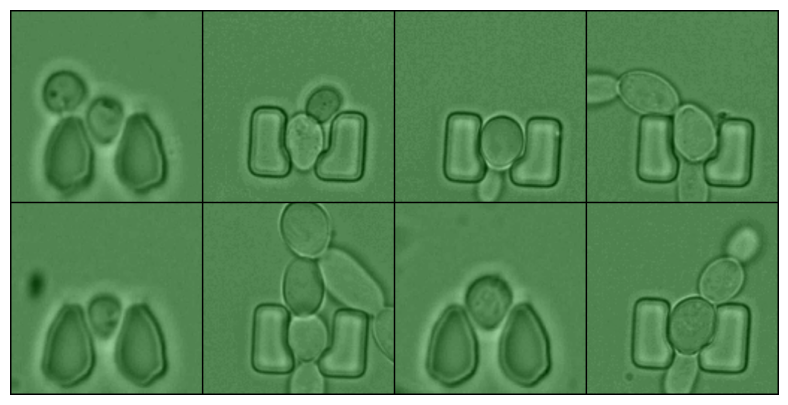

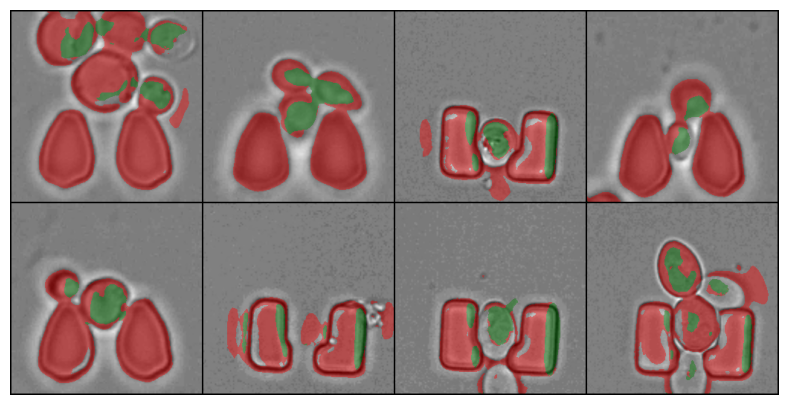

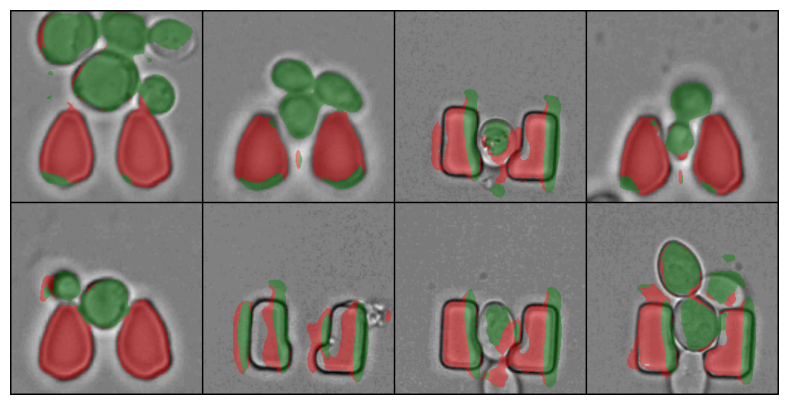

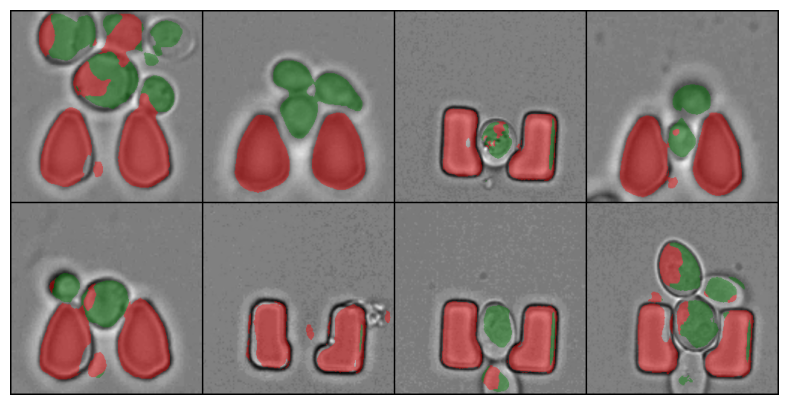

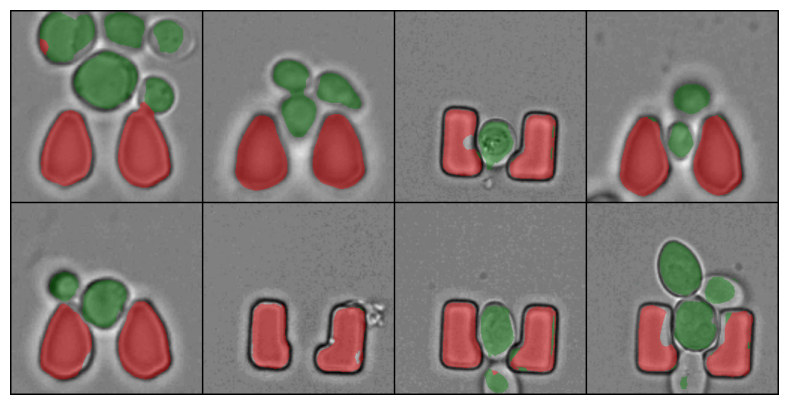

...

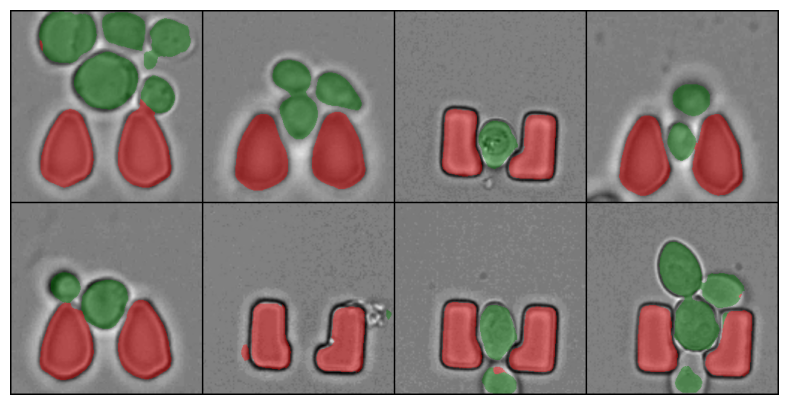

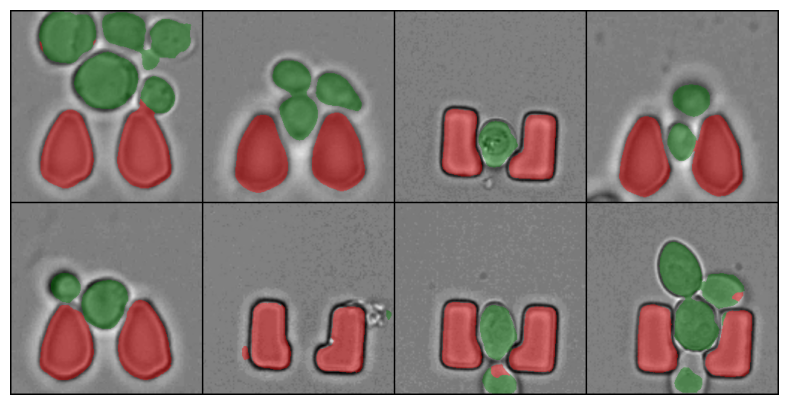

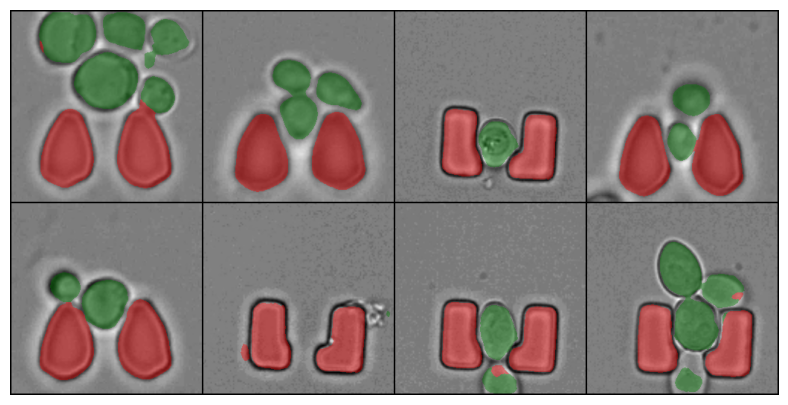

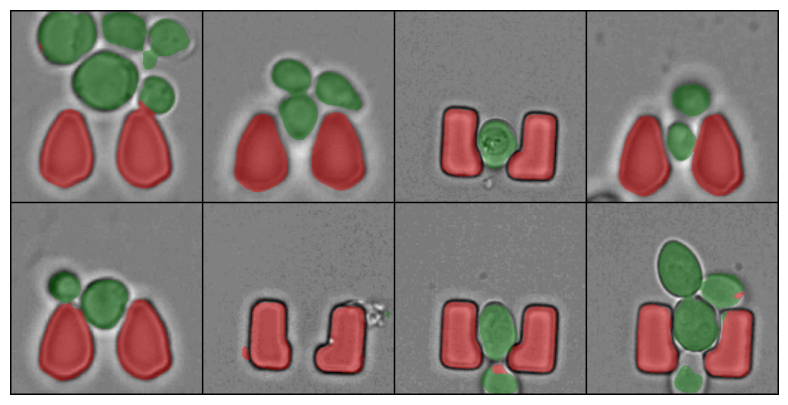

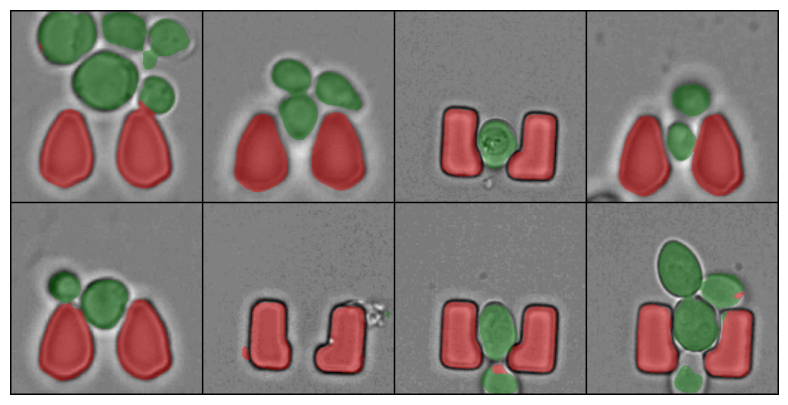

In [18]:
torch.manual_seed(42)
datamodule = Datamodule(
    datadir=Path("yeast_cell_in_microstructures_dataset"),
    dataset_class=YeastSemanticSegmDataset,
    batch_size=8,
)
datamodule.setup("fit")
images, masks = next(iter(datamodule.train_dataloader()))

trainer = L.Trainer(
    accelerator="auto",
    max_epochs=10,
    limit_train_batches=None,
    limit_val_batches=None,
)
model = Lit(
    model = UNet(n_channels=1, n_classes=3, channel_sizes=[16, 32, 64, 128], bilinear=True),
    learning_rate=1e-3,
)

trainer.fit(
    model=model,
    datamodule=datamodule,
)

trainer.validate(model=model, dataloaders=datamodule.val_dataloader())


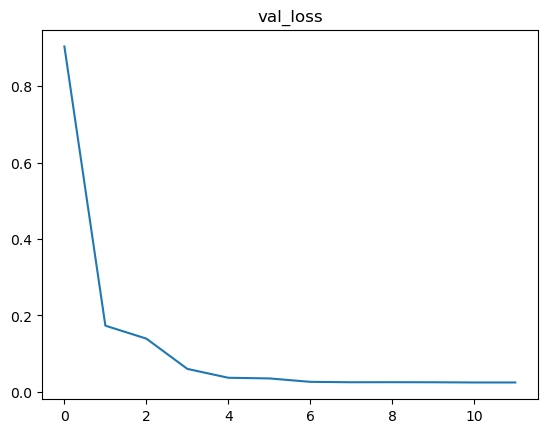

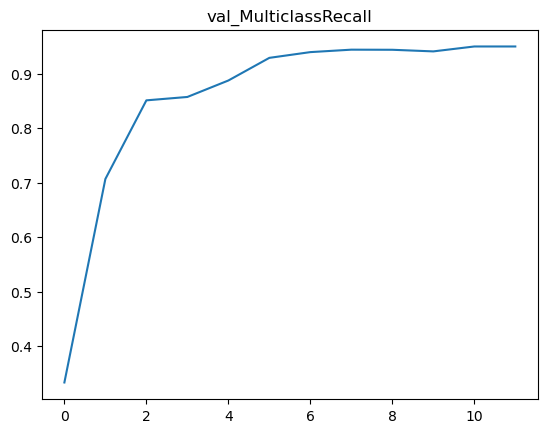

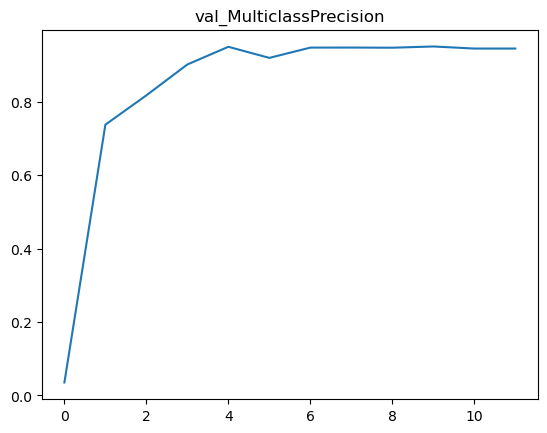

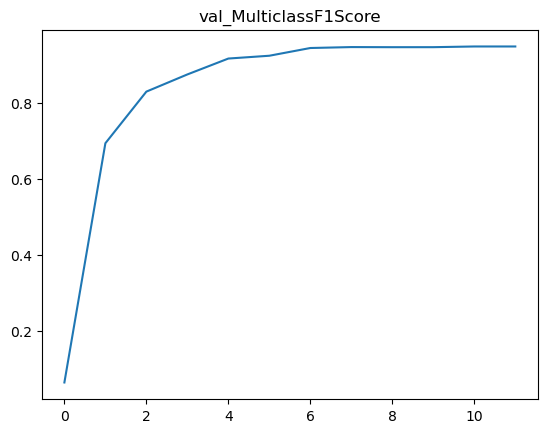

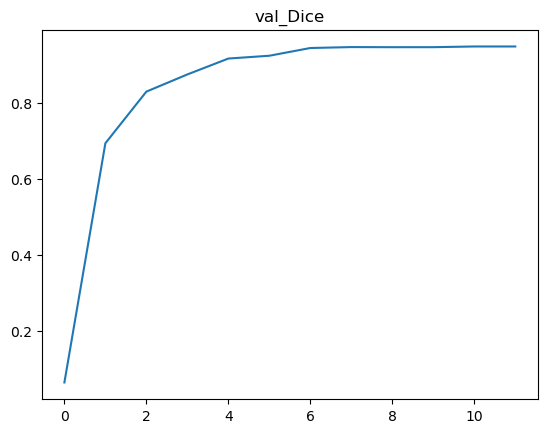

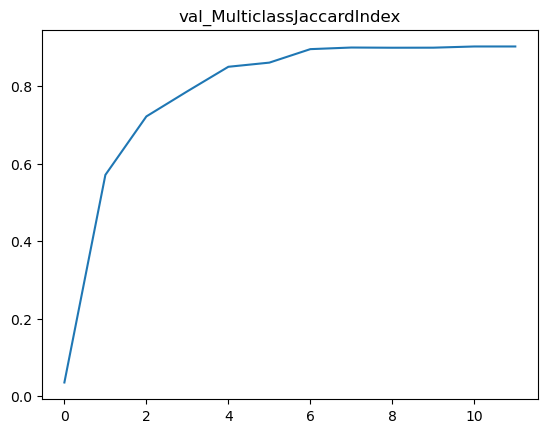

In [19]:
import matplotlib.pyplot as plt

for metric in metrics_for_plot:
  plt.title(metric)
  plt.plot(range(len(metrics_for_plot[metric])), metrics_for_plot[metric])
  plt.show()

In [48]:
from scipy.ndimage import distance_transform_edt
import numpy as np

def WeightedBCELoss(y_true_, y_pred):
    y_true_ = y_true_.to(device='cpu')
    y_pred =  y_pred.to(device='cpu')
    dist1 = distance_transform_edt(y_true_ == 1)
    dist2 = distance_transform_edt(y_true_ == 2)
    w0=10
    sigma=5

    if isinstance(dist1, np.ndarray):
        dist1 = torch.from_numpy(dist1)

    if isinstance(dist2, np.ndarray):
        dist2 = torch.from_numpy(dist2)

    weight_map = w0 * torch.exp(-(dist1 + dist2)**2 / (2 * sigma**2))

    ce_loss = F.nll_loss(F.log_softmax(y_pred.float(), dim=1), y_true_, reduction='none')
    weighted_loss = ce_loss * weight_map
   
    return torch.mean(weighted_loss)



Кажется это не совсем то, что просили в статье

Но завязано также на расстоянии до границы и судя по резултатам - работает неплохо

In [56]:
metrics_for_plot = {
            "val_loss": [],
            "val_MulticlassRecall": [],
            "val_MulticlassPrecision": [],
            "val_MulticlassF1Score": [],
            "val_Dice": [],
            "val_MulticlassJaccardIndex": []
}

class Lit(L.LightningModule):
    def __init__(self, model: nn.Module, learning_rate: float) -> None:
        super().__init__()
        self.save_hyperparameters()
        self.model = model
        self.learning_rate = learning_rate
        self.train_metrics = create_classification_metrics(num_classes=3, prefix="train_")
        self.val_metrics = create_classification_metrics(num_classes=3, prefix="val_")
        self.predictions = None
        self.images = None

    def training_step(
        self, batch: tuple[Tensor, Tensor], batch_idx: int
    ) -> STEP_OUTPUT:
        x, y = batch
        y_hat = self.model.forward(x)

        self.predictions = y_hat
        self.images = x
        
        loss = WeightedBCELoss(y, y_hat)

        self.log("train_loss", loss, on_epoch=True, on_step=False)
        self.train_metrics.update(y_hat, y)
        self.log_dict(self.train_metrics, on_step=False, on_epoch=True)

        return loss

    def validation_step(
        self, batch: tuple[Tensor, Tensor], batch_idx: int
    ) -> STEP_OUTPUT | None:
        x, y = batch
        y_hat = self.model.forward(x)

        self.predictions = y_hat
        self.images = x

        loss = WeightedBCELoss(y, y_hat)
        
        self.log("val_loss", loss, on_epoch=True, on_step=False)
        self.val_metrics.update(y_hat, y)
        self.log_dict(self.val_metrics, on_step=False, on_epoch=True)

        return {
            "loss": loss,
            "preds": y_hat,
        }

    def on_validation_epoch_end(self) -> None:
        val_loss = self.trainer.callback_metrics["val_loss"]
        val_f1 = self.trainer.callback_metrics["val_MulticlassF1Score"]
        val_recall = self.trainer.callback_metrics["val_MulticlassRecall"]
        val_precision = self.trainer.callback_metrics["val_MulticlassPrecision"]
        val_jaccard = self.trainer.callback_metrics["val_MulticlassJaccardIndex"]
        val_dice = self.trainer.callback_metrics["val_Dice"]
        update(self.trainer.callback_metrics)
        print(f" Val. Loss: {val_loss:.4f},\n Val. F1Score: {val_f1:.4f},\n Val. Recall: {val_recall:.4f},\n Val. Precision: {val_precision:.4f},\n Val. MulticlassJaccardIndex: {val_jaccard:.4f},\n Val. MulticlassDice: {val_dice:.4f}\n")
        print_result(self.predictions, self.images)
        self.val_metrics.reset()
        pass

    def configure_optimizers(self) -> dict[str, Any]:
        optimizer = torch.optim.Adam(self.model.parameters(), lr=self.learning_rate, weight_decay=1e-4)
        # давайте кроме оптимизатора создадим ещё расписание для шага оптимизации
        return {
            "optimizer": optimizer,
            "lr_scheduler": torch.optim.lr_scheduler.MultiStepLR(
                optimizer, milestones=[5, 10, 15]
            ),
        }

GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs

  | Name          | Type             | Params | Mode 
-----------------------------------------------------------
0 | model         | UNet             | 268 K  | train
1 | train_metrics | MetricCollection | 0      | train
2 | val_metrics   | MetricCollection | 0      | train
-----------------------------------------------------------
268 K     Trainable params
0         Non-trainable params
268 K     Total params
1.074     Total estimated model params size (MB)
87        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 11.2311,
 Val. F1Score: 0.0635,
 Val. Recall: 0.3333,
 Val. Precision: 0.0351,
 Val. MulticlassJaccardIndex: 0.0351,
 Val. MulticlassDice: 0.0635



Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 4.6928,
 Val. F1Score: 0.8570,
 Val. Recall: 0.8682,
 Val. Precision: 0.8573,
 Val. MulticlassJaccardIndex: 0.7586,
 Val. MulticlassDice: 0.8570



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 3.4045,
 Val. F1Score: 0.9063,
 Val. Recall: 0.9390,
 Val. Precision: 0.8787,
 Val. MulticlassJaccardIndex: 0.8325,
 Val. MulticlassDice: 0.9063



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 3.9142,
 Val. F1Score: 0.8227,
 Val. Recall: 0.9043,
 Val. Precision: 0.7797,
 Val. MulticlassJaccardIndex: 0.7174,
 Val. MulticlassDice: 0.8227



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 2.1141,
 Val. F1Score: 0.8992,
 Val. Recall: 0.9071,
 Val. Precision: 0.8960,
 Val. MulticlassJaccardIndex: 0.8223,
 Val. MulticlassDice: 0.8992



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 1.4586,
 Val. F1Score: 0.9393,
 Val. Recall: 0.9474,
 Val. Precision: 0.9321,
 Val. MulticlassJaccardIndex: 0.8872,
 Val. MulticlassDice: 0.9393



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 1.3412,
 Val. F1Score: 0.9505,
 Val. Recall: 0.9529,
 Val. Precision: 0.9482,
 Val. MulticlassJaccardIndex: 0.9070,
 Val. MulticlassDice: 0.9505



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 1.2993,
 Val. F1Score: 0.9508,
 Val. Recall: 0.9497,
 Val. Precision: 0.9520,
 Val. MulticlassJaccardIndex: 0.9076,
 Val. MulticlassDice: 0.9508



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 1.2996,
 Val. F1Score: 0.9502,
 Val. Recall: 0.9523,
 Val. Precision: 0.9482,
 Val. MulticlassJaccardIndex: 0.9065,
 Val. MulticlassDice: 0.9502



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 1.2558,
 Val. F1Score: 0.9500,
 Val. Recall: 0.9453,
 Val. Precision: 0.9550,
 Val. MulticlassJaccardIndex: 0.9062,
 Val. MulticlassDice: 0.9500



Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=10` reached.


 Val. Loss: 1.2258,
 Val. F1Score: 0.9509,
 Val. Recall: 0.9534,
 Val. Precision: 0.9484,
 Val. MulticlassJaccardIndex: 0.9076,
 Val. MulticlassDice: 0.9509



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 1.2258,
 Val. F1Score: 0.9509,
 Val. Recall: 0.9534,
 Val. Precision: 0.9484,
 Val. MulticlassJaccardIndex: 0.9076,
 Val. MulticlassDice: 0.9509

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
     Validate metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
         val_Dice             0.9508887529373169
  val_MulticlassF1Score       0.9508886337280273
val_MulticlassJaccardIndex    0.9076491594314575
 val_MulticlassPrecision      0.9484409093856812
   val_MulticlassRecall       0.9534100294113159
         val_loss             1.2257969800430264
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


[{'val_loss': 1.2257969800430264,
  'val_MulticlassRecall': 0.9534100294113159,
  'val_MulticlassPrecision': 0.9484409093856812,
  'val_MulticlassF1Score': 0.9508886337280273,
  'val_Dice': 0.9508887529373169,
  'val_MulticlassJaccardIndex': 0.9076491594314575}]

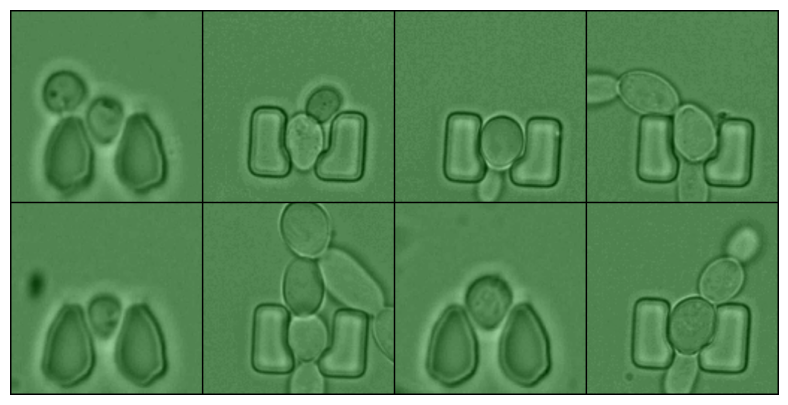

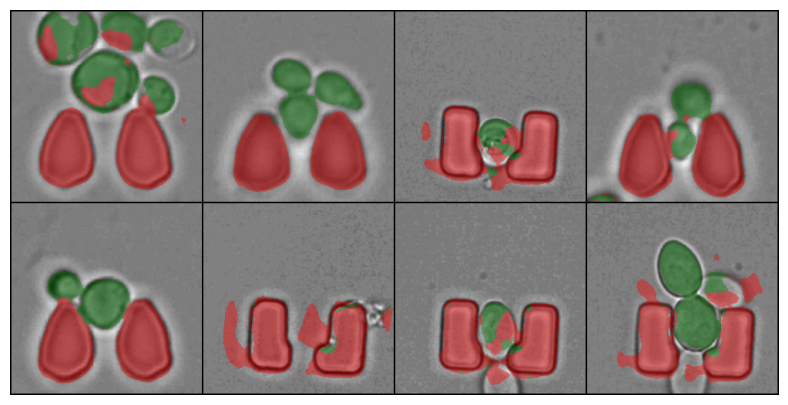

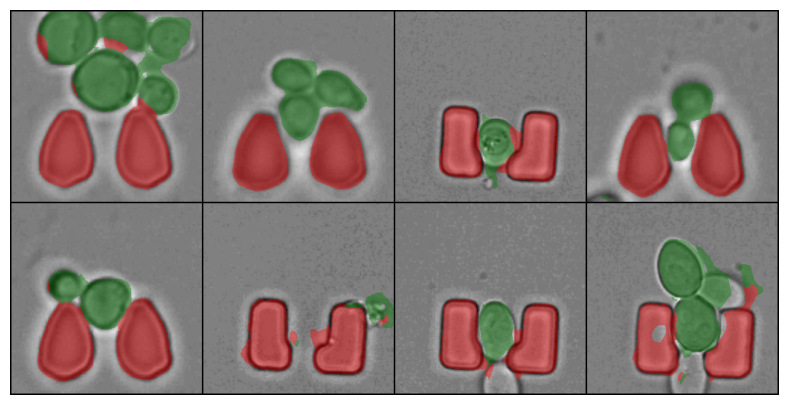

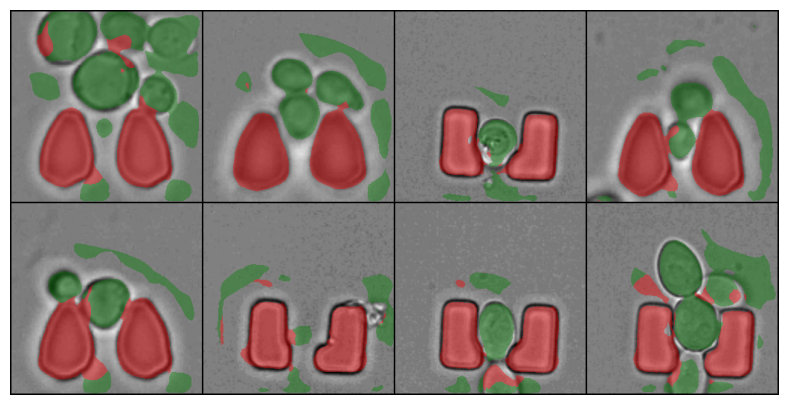

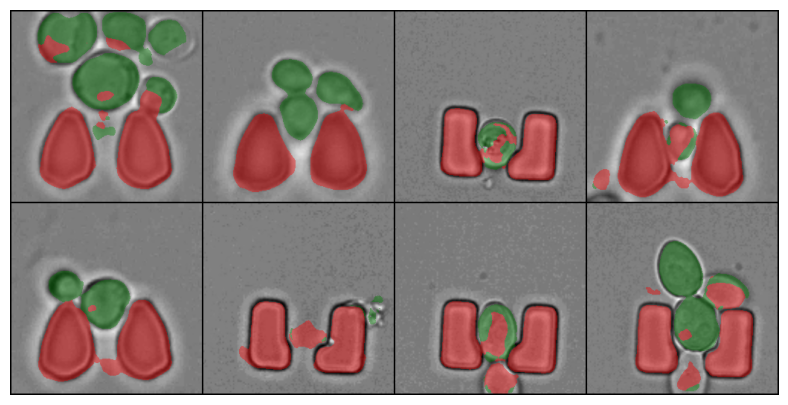

...

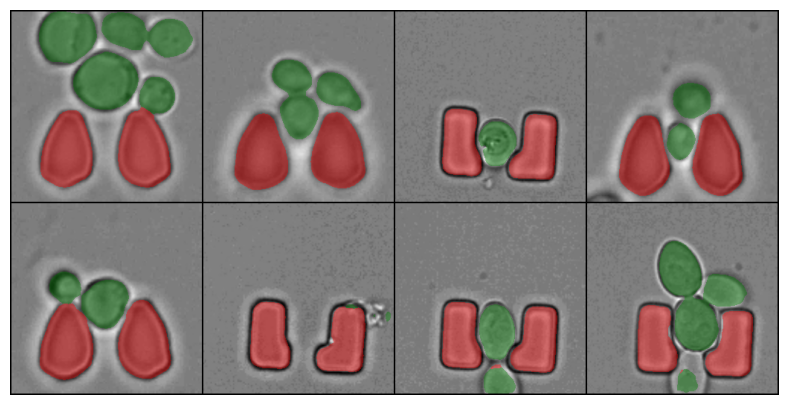

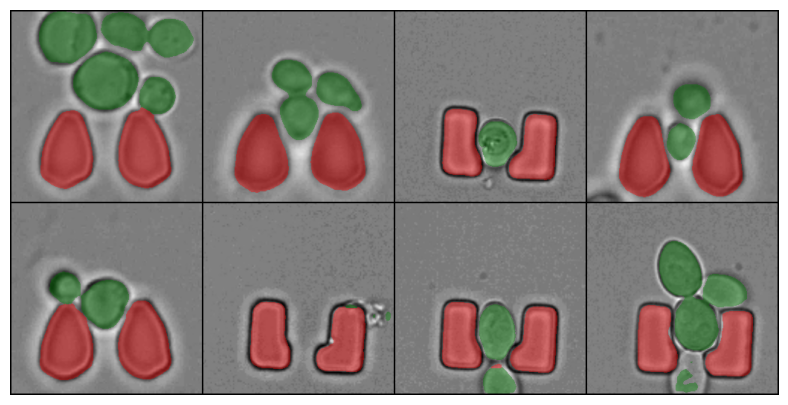

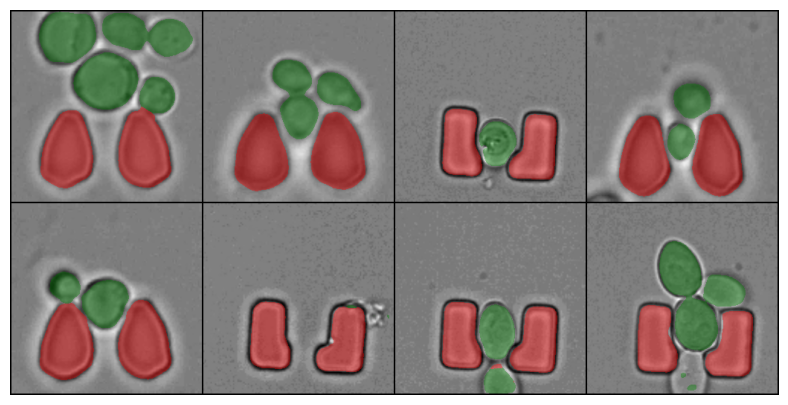

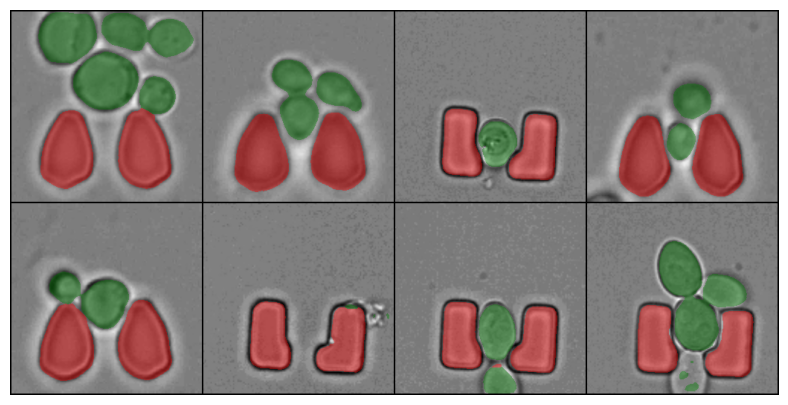

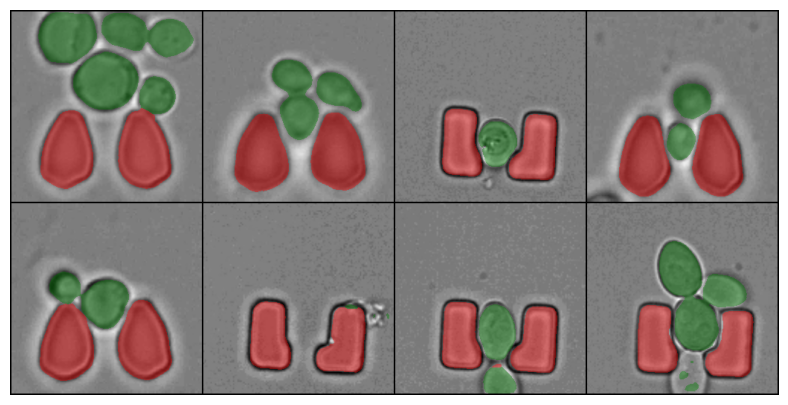

In [57]:
torch.manual_seed(42)
datamodule = Datamodule(
    datadir=Path("yeast_cell_in_microstructures_dataset"),
    dataset_class=YeastSemanticSegmDataset,
    batch_size=8,
)
datamodule.setup("fit")
images, masks = next(iter(datamodule.train_dataloader()))

trainer = L.Trainer(
    accelerator="auto",
    max_epochs=10,
    limit_train_batches=None,
    limit_val_batches=None,
)
model = Lit(
    model = UNet(n_channels=1, n_classes=3, channel_sizes=[16, 32, 64, 128], bilinear=True),
    learning_rate=1e-3,
)

trainer.fit(
    model=model,
    datamodule=datamodule,
)

trainer.validate(model=model, dataloaders=datamodule.val_dataloader())

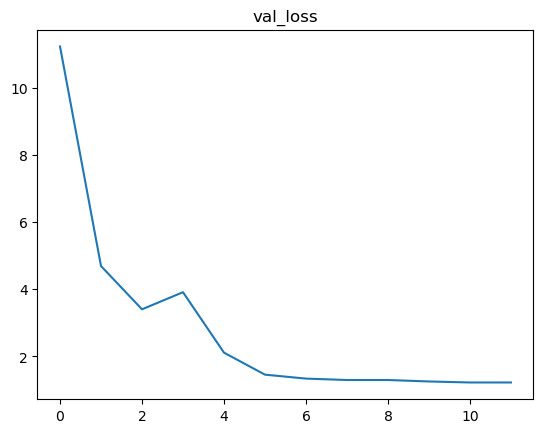

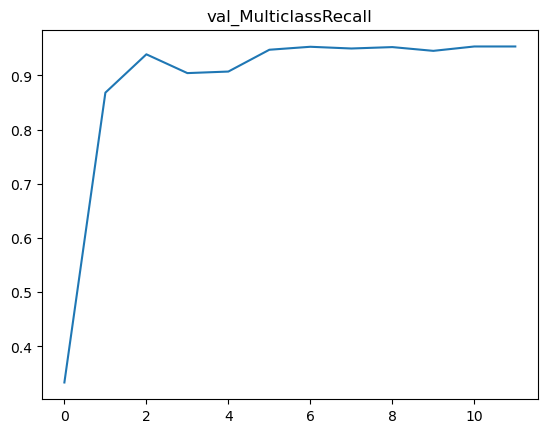

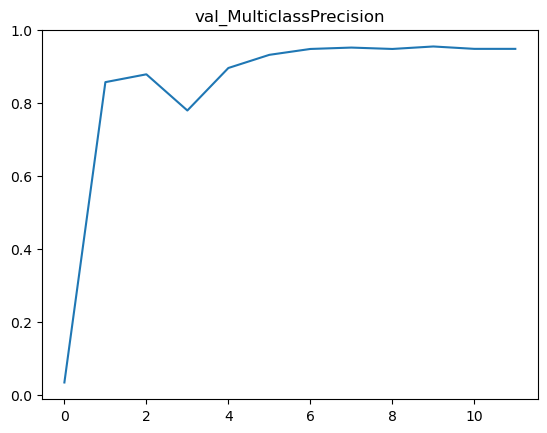

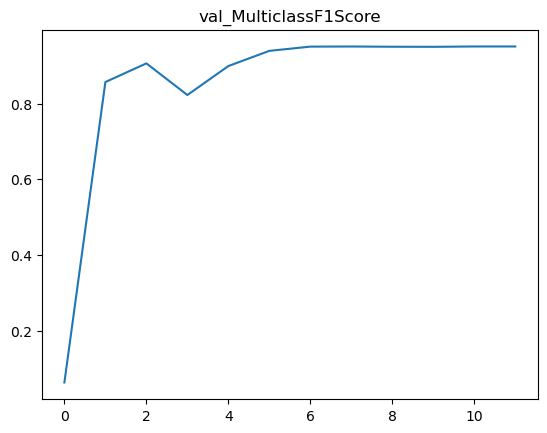

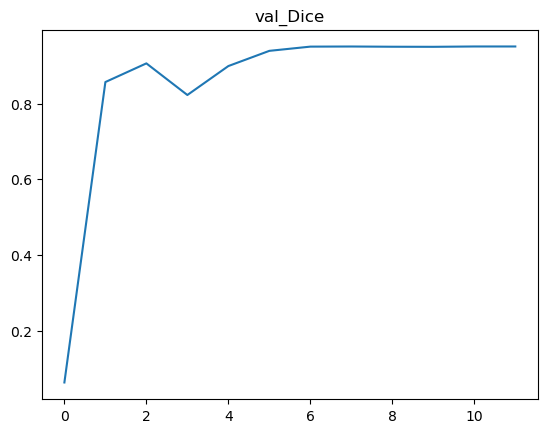

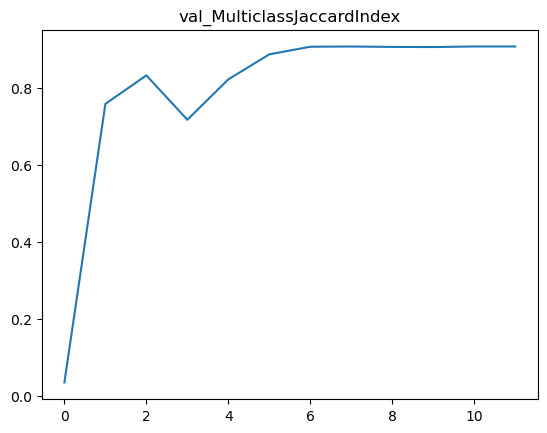

In [58]:
import matplotlib.pyplot as plt

for metric in metrics_for_plot:
  plt.title(metric)
  plt.plot(range(len(metrics_for_plot[metric])), metrics_for_plot[metric])
  plt.show()

Вроде как скокрость обучения у loss из статьи больше, чем при soft_dice_loss и почти такая же, как у cross_entropy.
Значение метрик на loss из статьи тоже лучше, чем на soft_dice_loss.

### Задание 4 (3 балла). Модификация архитектуры

Ваша задача - извлечь максимальную точность из модели, в которой будет не более 50k параметров. Для этого внесите правки в архитектуру модели.

В частности, попробуйте заменить в блоке `Down` комбинацию conv+maxpool на dilated conv (`nn.Conv2d(..., dilation=2)`). В остальном - полная свобода творчества, можете перерабатывать архитектуру как угодно.

Как обычно, запустите эксперимент (или несколько) с выводом всех графиков и картинок.

In [64]:
import scipy

class Down(nn.Module):
    """Downscaling with maxpool then double conv"""

    def __init__(self, in_channels: int, out_channels: int) -> None:
        super().__init__()
        self.conv = nn.Conv2d(
            in_channels=in_channels,
            out_channels=out_channels,
            kernel_size=3,
            stride=2,
            padding=2,
            dilation=2,
            bias=True,
        )

    def forward(self, x: Tensor) -> Tensor:
        return self.conv(x)

In [65]:
import torchmetrics.classification
from typing import Any

from lightning.pytorch.utilities.types import STEP_OUTPUT
from lightning.pytorch.loggers import TensorBoardLogger
from lightning.pytorch.callbacks import EarlyStopping, ModelCheckpoint

def print_result(predictions, images):
    original_images_grid = torchvision.utils.make_grid(images, nrow=4, normalize=True)
    masks_grid = torchvision.utils.make_grid(
        torch.nn.functional.one_hot(predictions.argmax(dim=1), 3).permute(0, 3, 1, 2)[:, 1:]
        > 0,
        nrow=4,
    )

    predictions_grid = torchvision.utils.draw_segmentation_masks(
        original_images_grid,
        masks=masks_grid,
        alpha=0.4,
        colors=["red", "green"],
    )

    plt.figure(figsize=(12, 5))
    plt.axis("off")
    plt.imshow(transforms.ToPILImage()(predictions_grid))

metrics_for_plot = {
            "val_loss": [],
            "val_MulticlassRecall": [],
            "val_MulticlassPrecision": [],
            "val_MulticlassF1Score": [],
            "val_Dice": [],
            "val_MulticlassJaccardIndex": []
}

def update(res):
  for h in metrics_for_plot:
    metrics_for_plot[h].append(float(res[h]))

def create_classification_metrics(
    num_classes: int, prefix: str
) -> torchmetrics.MetricCollection:
    return torchmetrics.MetricCollection(
        [
            torchmetrics.Recall(task="multiclass", num_classes=num_classes, average="macro"),
            torchmetrics.Precision(task="multiclass", num_classes=num_classes, average="macro"),
            torchmetrics.F1Score(task="multiclass", num_classes=num_classes, average="macro"),
            torchmetrics.Dice(num_classes=num_classes, average="macro"),
            torchmetrics.JaccardIndex(task="multiclass", num_classes=num_classes, average="macro")
        ],
        prefix=prefix,
    )


class Lit(L.LightningModule):
    def __init__(self, model: nn.Module, learning_rate: float) -> None:
        super().__init__()
        self.save_hyperparameters()
        self.model = model
        self.learning_rate = learning_rate
        self.train_metrics = create_classification_metrics(num_classes=3, prefix="train_")
        self.val_metrics = create_classification_metrics(num_classes=3, prefix="val_")
        self.predictions = None
        self.images = None

    def training_step(
        self, batch: tuple[Tensor, Tensor], batch_idx: int
    ) -> STEP_OUTPUT:
        x, y = batch
        y_hat = self.model.forward(x)

        self.predictions = y_hat
        self.images = x
        
        loss = F.cross_entropy(y_hat, y)
        self.log("train_loss", loss, on_epoch=True, on_step=False)
        self.train_metrics.update(y_hat, y)
        self.log_dict(self.train_metrics, on_step=False, on_epoch=True)

        return loss

    def validation_step(
        self, batch: tuple[Tensor, Tensor], batch_idx: int
    ) -> STEP_OUTPUT | None:
        x, y = batch
        y_hat = self.model.forward(x)

        self.predictions = y_hat
        self.images = x

        loss = F.cross_entropy(y_hat, y)
        self.log("val_loss", loss, on_epoch=True, on_step=False)
        self.val_metrics.update(y_hat, y)
        self.log_dict(self.val_metrics, on_step=False, on_epoch=True)

        return {
            "loss": loss,
            "preds": y_hat,
        }

    def on_validation_epoch_end(self) -> None:
        val_loss = self.trainer.callback_metrics["val_loss"]
        val_f1 = self.trainer.callback_metrics["val_MulticlassF1Score"]
        val_recall = self.trainer.callback_metrics["val_MulticlassRecall"]
        val_precision = self.trainer.callback_metrics["val_MulticlassPrecision"]
        val_jaccard = self.trainer.callback_metrics["val_MulticlassJaccardIndex"]
        val_dice = self.trainer.callback_metrics["val_Dice"]
        update(self.trainer.callback_metrics)
        print(f" Val. Loss: {val_loss:.4f},\n Val. F1Score: {val_f1:.4f},\n Val. Recall: {val_recall:.4f},\n Val. Precision: {val_precision:.4f},\n Val. MulticlassJaccardIndex: {val_jaccard:.4f},\n Val. MulticlassDice: {val_dice:.4f}\n")
        print_result(self.predictions, self.images)
        self.val_metrics.reset()
        pass

    def configure_optimizers(self) -> dict[str, Any]:
        optimizer = torch.optim.Adam(self.model.parameters(), lr=self.learning_rate, weight_decay=1e-4)
        # давайте кроме оптимизатора создадим ещё расписание для шага оптимизации
        return {
            "optimizer": optimizer,
            "lr_scheduler": torch.optim.lr_scheduler.MultiStepLR(
                optimizer, milestones=[5, 10, 15]
            ),
        }

GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs

  | Name          | Type             | Params | Mode 
-----------------------------------------------------------
0 | model         | UNet             | 46.5 K | train
1 | train_metrics | MetricCollection | 0      | train
2 | val_metrics   | MetricCollection | 0      | train
-----------------------------------------------------------
46.5 K    Trainable params
0         Non-trainable params
46.5 K    Total params
0.186     Total estimated model params size (MB)
60        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.9997,
 Val. F1Score: 0.2845,
 Val. Recall: 0.3333,
 Val. Precision: 0.2481,
 Val. MulticlassJaccardIndex: 0.2481,
 Val. MulticlassDice: 0.2845



Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.8789,
 Val. F1Score: 0.4005,
 Val. Recall: 0.5416,
 Val. Precision: -1889529215112682127956639744.0000,
 Val. MulticlassJaccardIndex: 0.3172,
 Val. MulticlassDice: 0.4005



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.5790,
 Val. F1Score: 0.4612,
 Val. Recall: 0.5763,
 Val. Precision: 0.4157,
 Val. MulticlassJaccardIndex: 0.3905,
 Val. MulticlassDice: 0.4612



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.4916,
 Val. F1Score: 0.4740,
 Val. Recall: 0.6068,
 Val. Precision: 0.4271,
 Val. MulticlassJaccardIndex: 0.4040,
 Val. MulticlassDice: 0.4740



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.3880,
 Val. F1Score: 0.8291,
 Val. Recall: 0.8404,
 Val. Precision: 0.8233,
 Val. MulticlassJaccardIndex: 0.7244,
 Val. MulticlassDice: 0.8291



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.3296,
 Val. F1Score: 0.8773,
 Val. Recall: 0.8561,
 Val. Precision: 0.9062,
 Val. MulticlassJaccardIndex: 0.7902,
 Val. MulticlassDice: 0.8773



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.3051,
 Val. F1Score: 0.8983,
 Val. Recall: 0.8784,
 Val. Precision: 0.9206,
 Val. MulticlassJaccardIndex: 0.8209,
 Val. MulticlassDice: 0.8983



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.2975,
 Val. F1Score: 0.9029,
 Val. Recall: 0.8963,
 Val. Precision: 0.9108,
 Val. MulticlassJaccardIndex: 0.8279,
 Val. MulticlassDice: 0.9029



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.2914,
 Val. F1Score: 0.9021,
 Val. Recall: 0.8896,
 Val. Precision: 0.9159,
 Val. MulticlassJaccardIndex: 0.8267,
 Val. MulticlassDice: 0.9021



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.2864,
 Val. F1Score: 0.9086,
 Val. Recall: 0.8952,
 Val. Precision: 0.9231,
 Val. MulticlassJaccardIndex: 0.8369,
 Val. MulticlassDice: 0.9086



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.2792,
 Val. F1Score: 0.9098,
 Val. Recall: 0.8960,
 Val. Precision: 0.9249,
 Val. MulticlassJaccardIndex: 0.8388,
 Val. MulticlassDice: 0.9098



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.2787,
 Val. F1Score: 0.9110,
 Val. Recall: 0.9069,
 Val. Precision: 0.9159,
 Val. MulticlassJaccardIndex: 0.8407,
 Val. MulticlassDice: 0.9110



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.2766,
 Val. F1Score: 0.9119,
 Val. Recall: 0.9064,
 Val. Precision: 0.9181,
 Val. MulticlassJaccardIndex: 0.8423,
 Val. MulticlassDice: 0.9119



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.2758,
 Val. F1Score: 0.9121,
 Val. Recall: 0.9039,
 Val. Precision: 0.9209,
 Val. MulticlassJaccardIndex: 0.8425,
 Val. MulticlassDice: 0.9121



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.2781,
 Val. F1Score: 0.9123,
 Val. Recall: 0.9113,
 Val. Precision: 0.9140,
 Val. MulticlassJaccardIndex: 0.8430,
 Val. MulticlassDice: 0.9123



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.2761,
 Val. F1Score: 0.9125,
 Val. Recall: 0.9095,
 Val. Precision: 0.9162,
 Val. MulticlassJaccardIndex: 0.8433,
 Val. MulticlassDice: 0.9125



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.2734,
 Val. F1Score: 0.9130,
 Val. Recall: 0.9050,
 Val. Precision: 0.9214,
 Val. MulticlassJaccardIndex: 0.8440,
 Val. MulticlassDice: 0.9130



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.2763,
 Val. F1Score: 0.9129,
 Val. Recall: 0.9089,
 Val. Precision: 0.9175,
 Val. MulticlassJaccardIndex: 0.8439,
 Val. MulticlassDice: 0.9129



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.2757,
 Val. F1Score: 0.9125,
 Val. Recall: 0.9052,
 Val. Precision: 0.9203,
 Val. MulticlassJaccardIndex: 0.8431,
 Val. MulticlassDice: 0.9125



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.2793,
 Val. F1Score: 0.9115,
 Val. Recall: 0.9099,
 Val. Precision: 0.9141,
 Val. MulticlassJaccardIndex: 0.8415,
 Val. MulticlassDice: 0.9115



Validation: |          | 0/? [00:00<?, ?it/s]

/var/folders/23/gk07fxd946l1r4t0lvylmd840000gn/T/ipykernel_85368/2994006925.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(12, 5))
`Trainer.fit` stopped: `max_epochs=20` reached.


 Val. Loss: 0.2738,
 Val. F1Score: 0.9129,
 Val. Recall: 0.9072,
 Val. Precision: 0.9191,
 Val. MulticlassJaccardIndex: 0.8438,
 Val. MulticlassDice: 0.9129



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.2738,
 Val. F1Score: 0.9129,
 Val. Recall: 0.9072,
 Val. Precision: 0.9191,
 Val. MulticlassJaccardIndex: 0.8438,
 Val. MulticlassDice: 0.9129

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
     Validate metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
         val_Dice             0.9128772616386414
  val_MulticlassF1Score       0.9128772020339966
val_MulticlassJaccardIndex    0.8438228368759155
 val_MulticlassPrecision      0.9190551042556763
   val_MulticlassRecall       0.9072171449661255
         val_loss             0.2737814784049988
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


[{'val_loss': 0.2737814784049988,
  'val_MulticlassRecall': 0.9072171449661255,
  'val_MulticlassPrecision': 0.9190551042556763,
  'val_MulticlassF1Score': 0.9128772020339966,
  'val_Dice': 0.9128772616386414,
  'val_MulticlassJaccardIndex': 0.8438228368759155}]

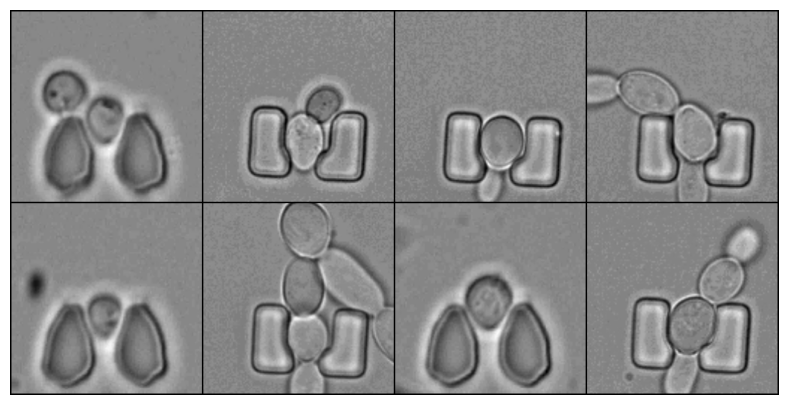

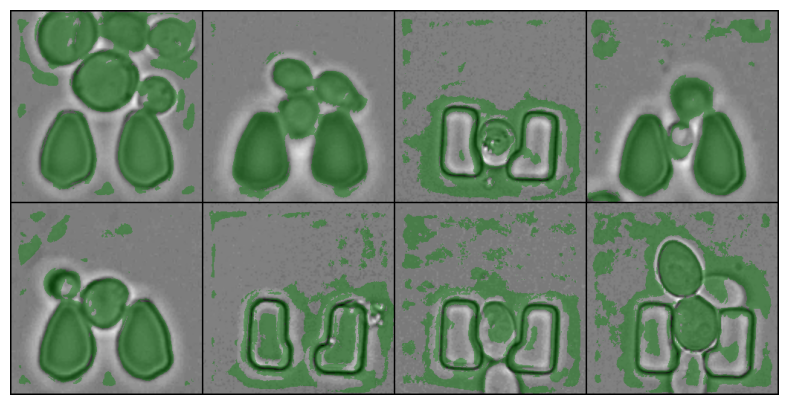

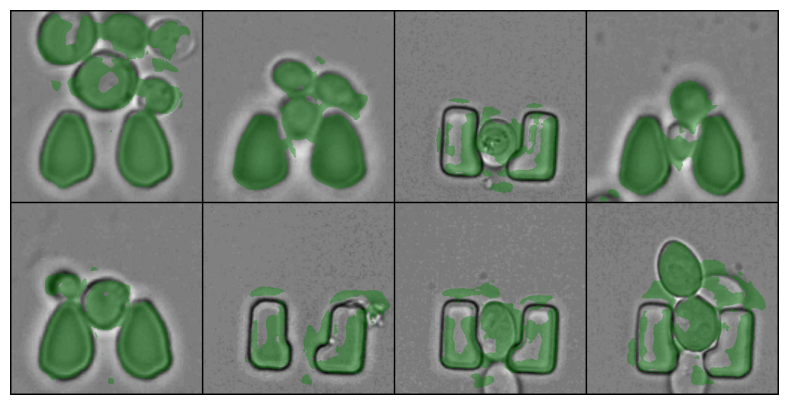

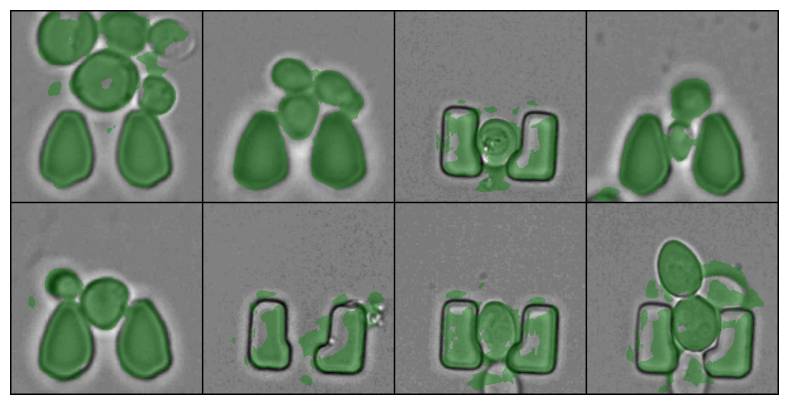

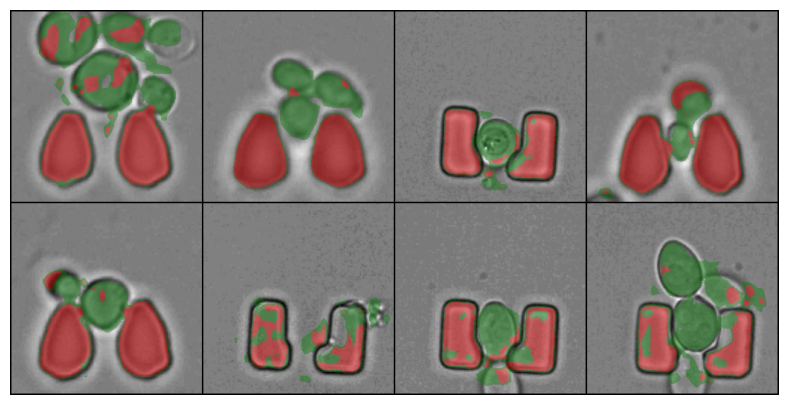

...

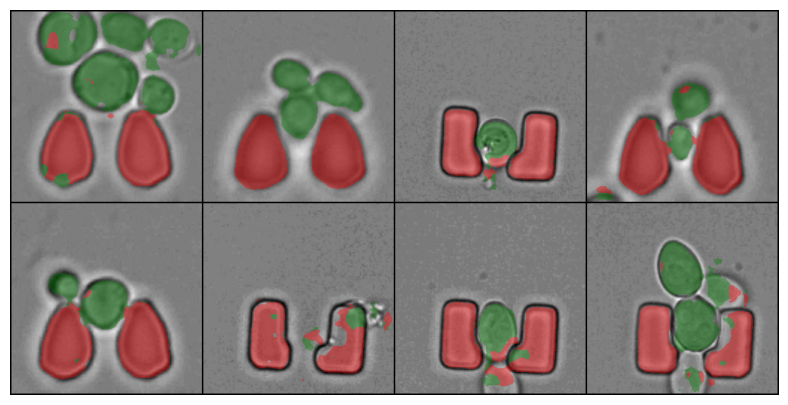

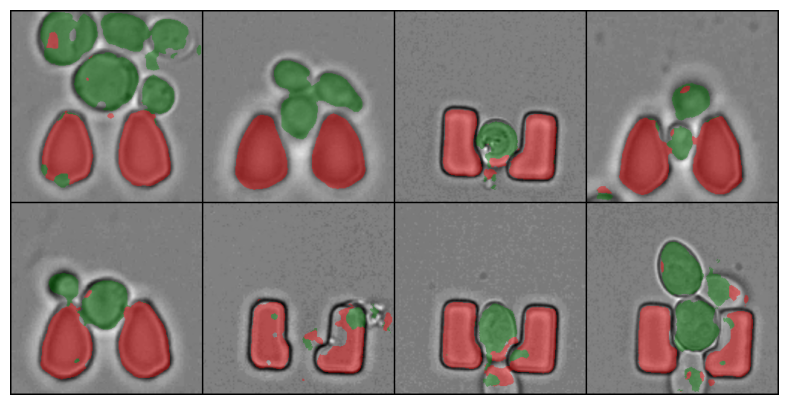

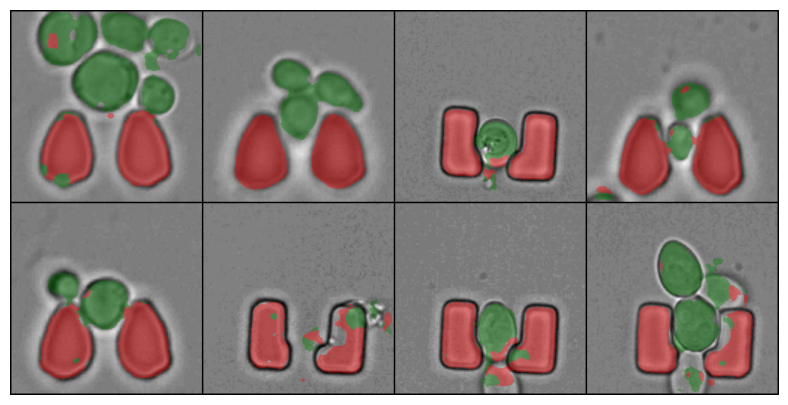

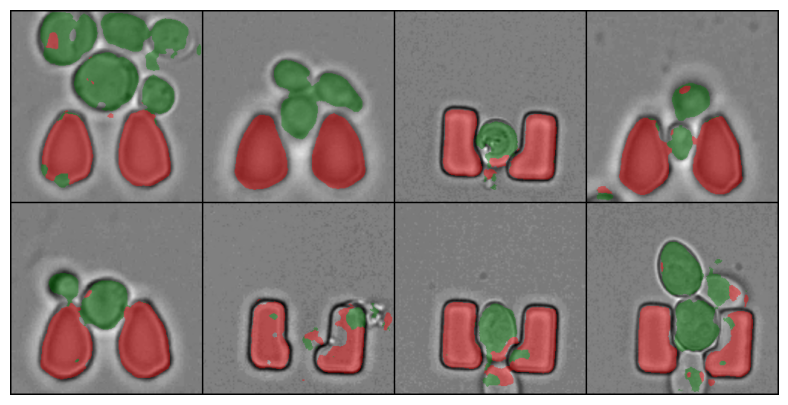

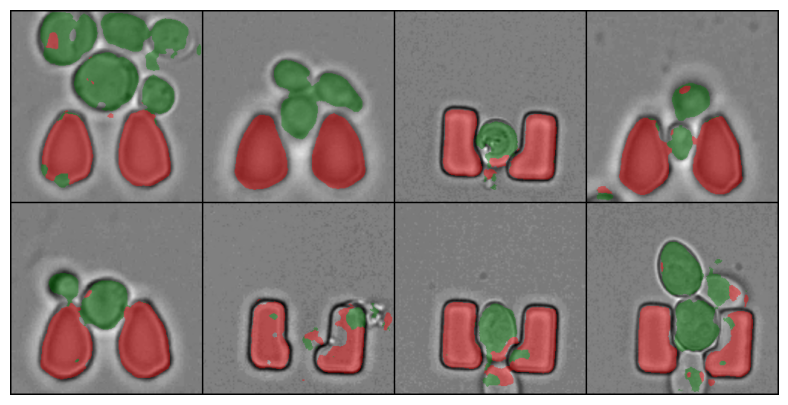

In [66]:
torch.manual_seed(42)
datamodule = Datamodule(
    datadir=Path("yeast_cell_in_microstructures_dataset"),
    dataset_class=YeastSemanticSegmDataset,
    batch_size=8,
)
datamodule.setup("fit")
images, masks = next(iter(datamodule.train_dataloader()))

trainer = L.Trainer(
    accelerator="auto",
    max_epochs=20,
    limit_train_batches=None,
    limit_val_batches=None,
)
model = Lit(
    model = UNet(n_channels=1, n_classes=3, channel_sizes=[8, 16, 32, 64], bilinear=True),
    learning_rate=1e-3,
)

trainer.fit(
    model=model,
    datamodule=datamodule,
)

trainer.validate(model=model, dataloaders=datamodule.val_dataloader())

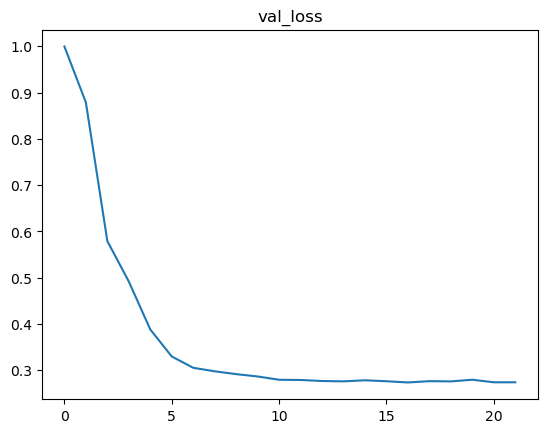

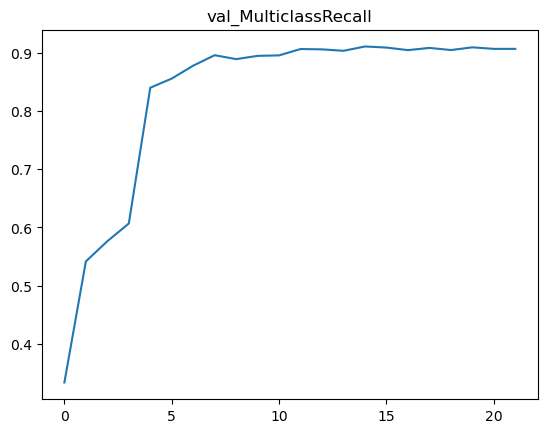

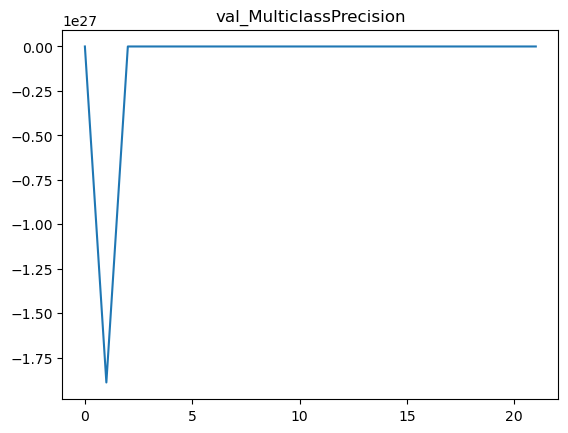

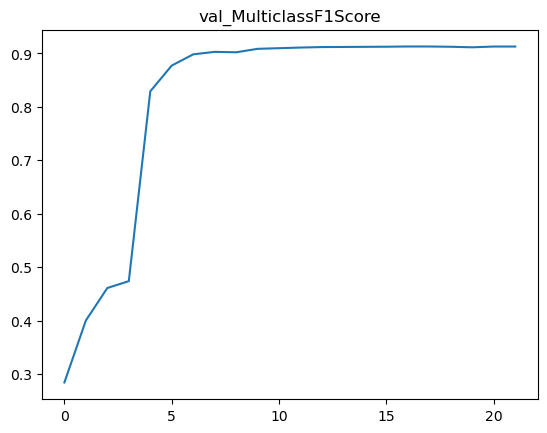

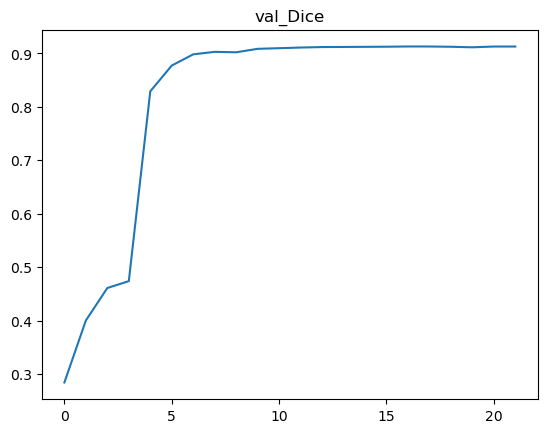

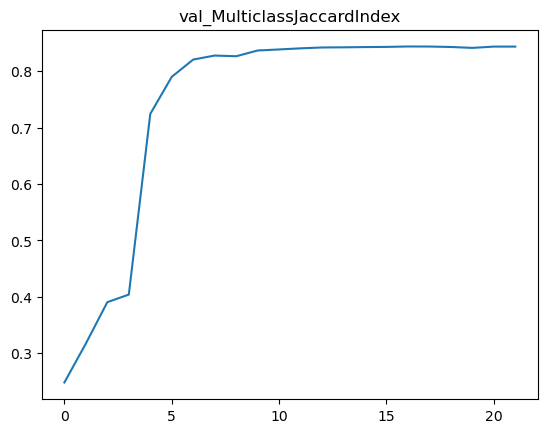

In [67]:
import matplotlib.pyplot as plt

for metric in metrics_for_plot:
  plt.title(metric)
  plt.plot(range(len(metrics_for_plot[metric])), metrics_for_plot[metric])
  plt.show()

Почти на всех метриках получили приемлимые значения